In [2]:
import numpy as np
import scipy
import random
import pandas as pd
import pickle
import seaborn.objects as so
import hashlib
import matplotlib.pyplot as plt

import seaborn as sns
from scipy.stats import ttest_ind
import scipy.stats as stats   

from IPython.display import display, HTML

In [3]:
class MetricManager:
    def __init__(self, metrics):
        """
        Inits the MetricManager

        Variables:
         - metrics: list of all metrics in form of a list of single runs
         - runs: parameters for the single runs extracted from the complete metrics
        """
        self.metrics = metrics.copy()
        self.set_perfect()
        self.full_metrics = self.metrics.copy()

        self.runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        
        self.runs["al_labels"] = self.runs.apply(lambda x: 1 if (x["labeled"]-x["init_size"])/x["labeled"] >= 0.5 else 0, axis=1)

        self.l2d_dfs = {
            "verma": {},
            "hemmer": {}
        }

        self.metric_dfs= {
            "verma": {},
            "hemmer": {}
        }

    def return_metrics_with_two(self):
        temp_metrics = []
        for run in self.metrics:
            if len(run["labeler_ids"]) == 2:
                temp_metrics.append(run)
        return temp_metrics

    def set_experts(self, labeler_ids):
        self.metrics = self.full_metrics.copy()

        remove_index = []
        for i in range(len(self.metrics)):
            if self.metrics[i]["labeler_ids"] != labeler_ids:
                remove_index.append(i)
        for i in remove_index[::-1]:
            del self.metrics[i]

        self.runs = pd.DataFrame(self.metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        
        self.runs["al_labels"] = self.runs.apply(lambda x: 1 if (x["labeled"]-x["init_size"])/x["labeled"] >= 0.5 else 0, axis=1)

    def set_perfect(self):
        labeler_used = []
        for i in range(len(self.metrics)):
            if self.metrics[i]["setting"] == "PERFECT":
                if self.metrics[i]["labeler_ids"] not in labeler_used:
                    for sample_equal in [True, False]:
                        for overlap in [0, 100]:
                            for expert_predict in ["target", "right"]:
                                new_metric = self.metrics[i].copy()
                                new_metric["overlap"] = overlap
                                new_metric["sample_equal"] = sample_equal
                                new_metric["expert_predict"] = expert_predict
                                self.metrics.append(new_metric)
                    labeler_used.append(self.metrics[i]["labeler_ids"])

        self.runs = pd.DataFrame(self.metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        
        self.runs["al_labels"] = self.runs.apply(lambda x: 1 if (x["labeled"]-x["init_size"])/x["labeled"] >= 0.5 else 0, axis=1)
        

    def get_dataframe_specific_run(self, run, method, seed, fold, step):
        """
        Returns a DataFrame for a given method of one (run, seed, fold) combination
        Step specifies the evaluation step (val, test)
        """
        if method == "verma":
            return self.create_dataframe_verma(run, seed, fold, step)
        if method == "hemmer":
            return self.create_dataframe_hemmer(run, seed, fold, step)

    def create_dataframe_verma(self, run, seed, fold, step):
        """
        Creates a dataframe which contains all metrics for verma for a given run, seed, fold and step

        Result is a DataFrame with every metric for the (run, seed, fold) combination
        """
        #Drops redundant columns
        df = pd.DataFrame(self.metrics[run]["verma"][seed][fold][step]).drop(["acc_experts", "cov_experts"], axis=0).T
        #Extract the number of images from coverage text
        df["coverage"] = df["coverage"].apply(lambda x: getCountOfCoverage(x))
        df["coverage_frac"] = df.apply(lambda x: x["cov_classifier"]/x["coverage"], axis=1)
        #df.rename(columns={'coverage':'n_images'}, inplace=True)
        return df

    def create_dataframe_hemmer(self, run, seed, fold, step):
        """
        Creates a dataframe which contains all metrics for hemmer for a given run, seed, fold and step

        Result is a DataFrame with every metric for the (run, seed, fold) combination
        """
        df = pd.DataFrame(self.metrics[run]["hemmer"][seed][fold][step]).T
        #Get the absolute number of images from the same combination from verma
        n_images = getCountOfCoverage(self.metrics[run]["verma"][seed][fold][step][0]["coverage"])
        #Extracts the experts ids
        experts = [column[7:] for column in df.columns if "Expert" in column]
        #Converts the percentage of coverage to absolute number
        df["Classifier Coverage"] = n_images * df["Classifier Coverage"]
        df["system_accuracy"] = df["system_accuracy"] * 100
        #Create metrics for every expert from list elements
        for expert in experts:
            df[f"{expert} Accuracy"] = [row["expert_accuracy"] for row in df[f"Expert_{expert}"]]
            df[f"{expert} Subset Accuracy"] = [row["expert_task_subset_accuracy"] for row in df[f"Expert_{expert}"]]
            df[f"{expert} Coverage"] = [n_images * row["expert_coverage"] for row in df[f"Expert_{expert}"]]
            df = df.drop([f"Expert_{expert}"], axis=1)
        return df

    def create_l2d_dataframe(self, method, step):
        """
        Creates a multiindex dataframe which contains all metrics for a L2D method and given step

        Result is a multiindex df (run, seed, fold)
        """
        dict_run = {}
        #Iterate over all runs
        for run in range(len(self.metrics)):
            dict_seed = {}
            #Iterate over all seeds
            for seed, val1 in self.metrics[run][method].items():
                dict_fold = {}
                #Iterate over every fold
                for fold, element in self.metrics[run][method][seed].items():
                    #Add metric for this (run, seed, fold) combination to the fold_dict
                    dict_fold[f"Fold_{fold}"] = self.get_dataframe_specific_run(run, method, seed, fold, step)
                #Create DataFrame for all folds in this (run, seed) combination
                df_seed = pd.concat(dict_fold)
                dict_seed[f"Seed_{seed}"] = df_seed
            #Create DataFrame for all seeds in this run
            df_run = pd.concat(dict_seed)
            dict_run[f"Run_{run}"] = df_run
        #Create DataFrame for all runs
        df_test = pd.concat(dict_run)
        return df_test

    def get_l2d_dataframe(self, method, step):
        """
        Returns the needed df

        Stores created dfs to speed up the process
        """
        if step not in self.l2d_dfs[method]:
            self.l2d_dfs[method][step] = self.create_l2d_dataframe(method, step)
        return self.l2d_dfs[method][step]

    def create_metric_dataframe(self, df, metric_name, method):
        """
        Creates the df for a L2D method and a specified aggregation method

        It chooses the metric from the single training step where the model had the best validation accuracy

        Current implemented are max for the aggregation of a (run, seed, fold) combination
        """
        #Only get the wanted metric
        dff = df[[metric_name]]

        #Get the indices where the model had the best validation accuracy
        #Matrix in form of columns=runs, rows=(seed + fold) (row index is range(len(seeds, folds combinations))
        indices = self.get_best_model_indices(method)

        #Get the indices for the complete dataframe (multiindex) in formate (run, seed, fold)
        index = dff.index
        #Get list of unique runs
        index_runs = index.get_level_values(0).drop_duplicates()
        #index_seeds = index.get_level_values(1).drop_duplicates()
        #index_folds = index.get_level_values(2).drop_duplicates()

        values = {}
        run_count = 0
        #Iterrate over all runs
        for run in index_runs:
            run_list = []
            count = 0
            #Get list of unique seeds in the current run
            index_seeds = dff.loc[run].index.get_level_values(0).drop_duplicates()
            #Iterrate over all seeds in the current run
            for seed in index_seeds:
                #Get list of qunique folds in the current run
                index_folds = dff.loc[(run, seed)].index.get_level_values(0).drop_duplicates()
                #Itterate over every fold in the current (run, seed) combination
                for fold in index_folds:
                    #Append the value from the current (run, seed, fold) combination on position indices.iloc[count, run_count] 
                    # (which is the training step from (run, seed, fold) where the model had the best val accuracy
                    run_list.append(dff.loc[(run, seed, fold, indices.iloc[count, run_count])][0])
                    #increases the parameter for index selection
                    count += 1
                values[run] = run_list
            run_count += 1
        #return pd.DataFrame(values)
        return pd.DataFrame(dict([(key, pd.Series(item)) for key, item in values.items()]))

    def get_best_model_indices(self, method):
        """
        Creates a df which contains the training step for every (run, seed, fold) combination in which the model had the best validation accuracy

        Returns a df the form of columns=runs, rows=range(len(seed - fold combinations in this run))
        """
        df = self.get_l2d_dataframe(method, "val") #Get metrics for every run, seed, fold
        dff = df[["system_accuracy"]]
        index = dff.index
        index_runs = index.get_level_values(0).drop_duplicates()

        #Iterrate ofer the complete multiindex df of system accuracy
        values = {}
        for run in index_runs:
            run_list = []
            index_seeds = dff.loc[run].index.get_level_values(0).drop_duplicates()
            for seed in index_seeds:
                index_folds = dff.loc[(run, seed)].index.get_level_values(0).drop_duplicates()
                for fold in index_folds:
                    #Get the index of the step of this (run, seed, fold) combination where the system accuracy is max
                    run_list.append(pd.to_numeric(dff.loc[(run, seed, fold), "system_accuracy"]).idxmax())
            values[run] = run_list
        #Returns df
        return pd.DataFrame(dict([(key, pd.Series(item)) for key, item in values.items()]))

    def get_metric_dataframe(self, method, step, metric_name):
        """
        Returns a dataframe for one metric

        Columns are runs, rows are the max of the L2D systems metric for every fold
        """
        df = self.get_l2d_dataframe(method, step) #Get metrics for every run, seed, fold

        if step not in self.metric_dfs[method]:
            self.metric_dfs[method][step] = {}
        if metric_name not in self.metric_dfs[method][step]:
            self.metric_dfs[method][step][metric_name] = self.create_metric_dataframe(df, metric_name, method)

        return self.metric_dfs[method][step][metric_name].copy()

    def get_metrics_dataframe_cut(self, method, step, metric_name, unwanted_tuple=None):
        """
        Cuts the name and add the posibility to remove unwanted parameter-value pairs
        """
        df = cut_column_name(self.get_metric_dataframe(method, step, metric_name))
        columns = df.columns
        if unwanted_tuple is not None: # Get only indieces of runs without unwanted parameter-value pairs
            columns = [str(el) for el in list(remove_unwanted_runs(self.runs, unwanted_tuple).index)]
        return df.loc[:,columns] #Return metric for every run with applied method to aggregate seeds and folds
        

    def print_metrics(self, df):
        """
        Prints the columns of a drataframe to get all available metrics
        """
        print(df.columns)

    def getRuns(self):
        return self.runs.copy()

In [4]:
def getCountOfCoverage(text):
    """
    Returns the number of images from the verma-metric coverage text
    """
    marker = None
    for j in range(len(text)):
        if text[-j] == "f":
            marker = j -1
    return int(text[-marker:])

def cut_column_name(df):
    """
    Removes the run_ prefix for every column
    """
    columns = [column[4:] for column in df.columns]
    df.columns = columns
    return df

def runs_cost_to_string(df):
    df = df.copy()
    if "cost" in df.columns:
        df["cost"] = df["cost"].apply(lambda x: cost_to_string(x))
    return df

def cost_to_string(cost):
    return str(cost)

def remove_unwanted_runs(df, unwanted_tuples):
    """
    Removes runs which contains unwanted column-value combinations

    Input:
        df - DataFrame which contains all runs
        unwanted_tuples - List of (column, value) pairs which should be removed
    """
    if isinstance(unwanted_tuples, tuple): #Make sure a single tuple doesn't break the code
        unwanted_tuples = [unwanted_tuples]
    dff = df.copy()
    for pair in unwanted_tuples:
        if (pair[0] in dff.columns): #Check if the column exists in the DataFrame
            dff = dff[dff[pair[0]] != pair[1]]
    return dff

def keep_wanted_runs(df, wanted_tuples):
    """
    Removes runs which contains unwanted column-value combinations

    Input:
        df - DataFrame which contains all runs
        unwanted_tuples - List of (column, value) pairs which should be removed
    """
    if isinstance(wanted_tuples, tuple): #Make sure a single tuple doesn't break the code
        wanted_tuples = [wanted_tuples]
    dff = df.copy()
    for pair in wanted_tuples:
        if (pair[0] in dff.columns): #Check if the column exists in the DataFrame
            dff = dff[dff[pair[0]] == pair[1]]
    return dff

In [5]:
def check_all_ttest(df, p=0.05, equal_var=False, plot=False):
    """
    Checks all columns of the dataframe of statistical significance
    """
    matrix = {}
    for i in df.columns:
        row = {}
        for j in df.columns:
            if i == j:
                row[j] = 1
            else:
                res = get_ttest(df.loc[:,[i]], df.loc[:,[j]], equal_var=equal_var)
                row[j] = res.pvalue[0]
        matrix[i] = row

    if plot:
        df = pd.DataFrame(matrix)
        heat = plot_ttests(df)
        return matrix, heat
    return matrix

def get_ttest(value1, value2, equal_var=True):
    res = ttest_ind(value1, value2, equal_var=equal_var, nan_policy="omit")
    #print(res)
    return res

def plot_ttests(df):
    # Draw a heatmap with the numeric values in each cell
    f, ax = plt.subplots(figsize=(25, 11))
    heat = sns.heatmap(df, annot=True, linewidths=.5, ax=ax)
    plt.show()
    return heat

In [6]:
def get_rungroup_name(df_runs, runs_g, var_columns, reverse=False):
    """
    Create names for every run where the runs differentiate in parameters

    Input:
        df_runs: DataFrame with every run and its parameters
        runs_g: Group of runs in structure [[0, 1, 2], [3, 4]]
        var_columns: Names of columns which can vary in a aggregated run
        reverse: If all columns could vary except of the given ones

    Return:
        run_names: Names for every run
        keys: Columnnames in which the runs are different
    """
    const_columns = [column for column in df_runs.columns if column not in var_columns]
    if reverse:
        const_columns = var_columns

    group_dict = []
    for run_group in runs_g:
        group_dict.append(dict(df_runs.loc[run_group[0], const_columns]))

    keys = []
    for i in range(len(group_dict) - 1):
        temp_keys = [k for k in group_dict[i] if group_dict[i][k] != group_dict[i + 1][k]]
        for key in temp_keys:
            if key not in keys:
                keys.append(key)
    keys.reverse()

    run_names = []
    for run_group in runs_g:
        run_names.append(create_run_name_from_columns(df_runs.loc[run_group[0]], keys))

    return run_names, keys

def create_run_name_from_columns(run, columns):
    """
    Concats names of columns with value for one run

    Input:
        run: DataFrame which contains one run with its parameters
        columns: The columns to build the name

    Return:
        Concated string from column-value pairs
    """
    name = ""
    #columns.reverse()
    for column in columns:
        name = name + f"{column}_{run.loc[column]}_"
    return name[:-1]


def get_runs_grouped(df, var_columns, reverse=False):
    """
    Groups the runs by their parameters
    All parameters except the passed ones are equal

    Returns a list whichs elements are lists of equal runs like [[0, 1, 2], [3, 4, 5]]
    """
    #Gets the columns which defines a aggregated run (stay constant for on aggregation)
    const_columns = [column for column in df.columns if column not in var_columns]
    #If all columns should be variable except the given ones
    if reverse:
        const_columns = var_columns

    pairs = []
    referenc_row = None
    index_list = list(df.index)
    #For every run in the dataframe
    for index in df.index:
        #If the run already is aggregated into one group
        if index in [el for sublist in pairs for el in sublist]:
            continue
        #Remove index to prevent adding it into the group to himself
        index_list.remove(index)
        #Get the reference row with the conctant columns
        referenc_row = df.loc[index, const_columns].to_dict()
        pair = [index]
        #Look at all other runs
        for index_j in index_list:
            current_row = df.loc[index_j, const_columns].to_dict()
            #If the current row equals the reference  row in the constant columns
            if referenc_row == current_row:
                pair.append(index_j)
        #Removed aggregated rows to prevent aggregation into different groups
        for el in pair:
            if el in index_list:
                index_list.remove(el)
        pairs.append(pair)
    return pairs

def get_runs_grouped_metric(df_runs, df_metrics, var_columns, reverse=False, unwanted_tuples=None):
    """
    Returns a DataFrame where the runs are aggregated and metrics for are combined for a aggregation

    A Aggregated run contains all metrics for every run it contains
    
    Parameter:
        var_columns are the coulmns which aren't fix, all other are
        Reverse makes all columns variable except var_columns

    Return:
        df - The DataFrame which contains aggregated runs with metrics
        df_runs.loc[first_indices, keys] - List of the aggregated runs from df_runs to show the parameters of the aggregated runs
    """

    #Remove unwanted runs
    if unwanted_tuples is not None:
        df_runs = remove_unwanted_runs(df_runs, unwanted_tuples)
    df_runs = runs_cost_to_string(df_runs)
    #Get groups of runs
    g_runs = get_runs_grouped(df_runs, var_columns, reverse)
    df = None
    first_indices = []
    for run_group in g_runs:
        #Append first run of group to show the parameters of a group
        first_indices.append(run_group[0])
        values = []
        #For every run in a group
        for run in run_group:
            #Aggregate the values of every run in this group
            values = values + df_metrics[str(run)].tolist()
        #Create Dataframe with aggregated values
        dff = pd.DataFrame(values, columns=[str(run_group)])
        #If first element of the group create Dataframe
        if df is None:
            df = dff
        else: #Concat for every other run in the group
            df = pd.concat([df, dff], axis=1)

    #keys are the columns of runs where the values are different in the aggregated runs
    #Prevents from printing column-values which are constant over all run groups
    df.columns, keys = get_rungroup_name(df_runs, g_runs, var_columns, reverse)

    df.columns = df_runs.loc[first_indices, keys].index
    
    return df, df_runs.loc[first_indices, keys]

def get_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None):
    """
    Creates a DataFrame in long formate (for seaborn) which groups runs over equal columns and changing var_columns

    Parameter:
        df_runs: DataFrame containing all runs
        df_metrics: DataFrame containing values for one metric over every run and every fold (Columns are runs, rows are the max/var of the L2D systems metric for every fold)
        var_columns: Columns which can vary in a aggregated run
        unwanted_tuples: parameter-value pairs of runs which should be removed
    """
    if unwanted_tuples is not None:
        df_runs = remove_unwanted_runs(df_runs, unwanted_tuples)
    df_runs = runs_cost_to_string(df_runs)
    
    g_runs = get_runs_grouped(df_runs, var_columns, False)

    df = None
    first_indices = []
    dfs = []
    for run_group in g_runs:
        first_indices.append(run_group[0])
        values = {}
        run_dfs = []
        for run in run_group:
            temp_dict = {
                "value": df_metrics[str(run)],
            }
            for column in var_columns:
                temp_dict[column] = [df_runs.loc[run, column] for i in range(len(temp_dict["value"]))]
            df = pd.DataFrame(temp_dict)
            #print(df)
            run_dfs.append(df)
        dff = pd.concat(run_dfs)
        dff["group"] = [run_group[0] for i in range(len(dff))]
        dfs.append(dff)

    _, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)
    
    return pd.concat(dfs), df_runs.loc[first_indices, keys]

def plot_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None, y_text="value", sorted_columns=None, slice=None):
    df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_metrics, var_columns, unwanted_tuples)
    

    if slice is not None:
        runs_df = runs_df.iloc[slice[0]:slice[1]]
        df = df[df["group"].isin(runs_df.index)]

    f, ax = plt.subplots(figsize=(25, 11))

    display(HTML(runs_df.to_html()))

    #lis = sorted(df[var_columns].apply(tuple, axis=1), key=lambda tup: tup[0])
    lis = df[var_columns].apply(tuple, axis=1)
    
    df.reset_index(inplace=True)
    lis.reset_index(inplace=True, drop = True,)

    g = sns.boxplot(df, y="value", x="group", hue=lis)

    ax.set(xlabel='group', ylabel=y_text)

    series = pd.Series(df[var_columns].apply(tuple, axis=1))
    for i in range(len(var_columns)):
        name = var_columns[i]
        for j, el in enumerate(series):
            el = list(series.iloc[j])
            el[i] = f"{name}: {el[i]}"
            series.iloc[j] = tuple(el)

    if sorted_columns is not None:
        li = list(series.unique())
        sorted_list = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in sorted_columns]]))
    else:
        sorted_list = list(series.unique())

    plt.legend(loc='upper right')
    for t, l in zip(g.legend_.texts, sorted_list):
        t.set_text(l)

    plt.show(g)

    return df, runs_df, lis


def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1


def get_uniq_values(df, column):
    if column in df.columns:
        return set(df[column].values)

def group_ttest(df, plot=False):

    group_test = []
    df = runs_cost_to_string(df)
    for group in get_uniq_values(df, "group"):
        group_df = df[df["group"] == group]

        columns = list(group_df.columns)
        columns.remove("value")
        columns.remove("group")

        dff = group_df.pivot(columns=columns, values='value')

        group_test.append(pd.DataFrame(check_all_ttest(dff)))

    return group_test

In [56]:
with open("../../Metrics_Folder/CIFAR100/Metrics_97.pickle", 'rb') as handle:
    metrics2 = pickle.load(handle)

metricManager = MetricManager(metrics2)

df_runs = metricManager.runs

In [7]:
np.unique(df_runs["labeler_ids"].values)

array([list(['60_1', '60_2'])], dtype=object)

In [8]:
df_runs

,labeler_ids,init_size,labels_per_round,rounds,labeled,cost,overlap,setting,mod,expert_predict,sample_equal,epochs_pretrain,al_labels
0,"[60_1, 60_2]",4,4,2,12,"(0, 0)",0,SSL_AL,confidence,target,True,0,1
1,"[60_1, 60_2]",4,4,2,12,"(0, 0)",0,SSL_AL,confidence,target,False,0,1
2,"[60_1, 60_2]",4,4,2,12,"(0, 0)",100,SSL_AL,confidence,target,True,0,1
3,"[60_1, 60_2]",4,4,2,12,"(0, 0)",100,SSL_AL,confidence,target,False,0,1
4,"[60_1, 60_2]",4,4,4,20,"(0, 0)",0,SSL_AL,confidence,target,True,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,"[60_1, 60_2]",8,8,4,40,"(0, 0)",0,SSL,ssl,right,False,0,1
89,"[60_1, 60_2]",8,16,2,40,"(0, 0)",0,SSL,ssl,right,False,0,1
90,"[60_1, 60_2]",16,4,2,24,"(0, 0)",0,SSL,ssl,right,False,0,0
91,"[60_1, 60_2]",16,4,4,32,"(0, 0)",0,SSL,ssl,right,False,0,1


In [149]:
wide_format = (17, 7)
small_format = (13, 11)
wide_format_h = (17, 9)

median = False

if median:
    estimator = estimator
else:
    estimator = np.mean

# System

In [10]:
np.unique(df_runs["labeler_ids"].values)

array([list(['60_1', '60_2'])], dtype=object)

In [57]:
metricManager.get_l2d_dataframe("verma", "val").columns

Index(['coverage', 'system_accuracy', 'expert_accuracy', 'classifier_accuracy',
       'alone_classifier', 'validation_loss', 'n_experts', 'expert_0',
       'expert_1', 'expert_0_coverage', 'expert_1_coverage', 'cov_classifier',
       'coverage_frac'],
      dtype='object')

,labeled
0,12
4,20
10,36
14,16
16,24
20,40
26,32
58,48


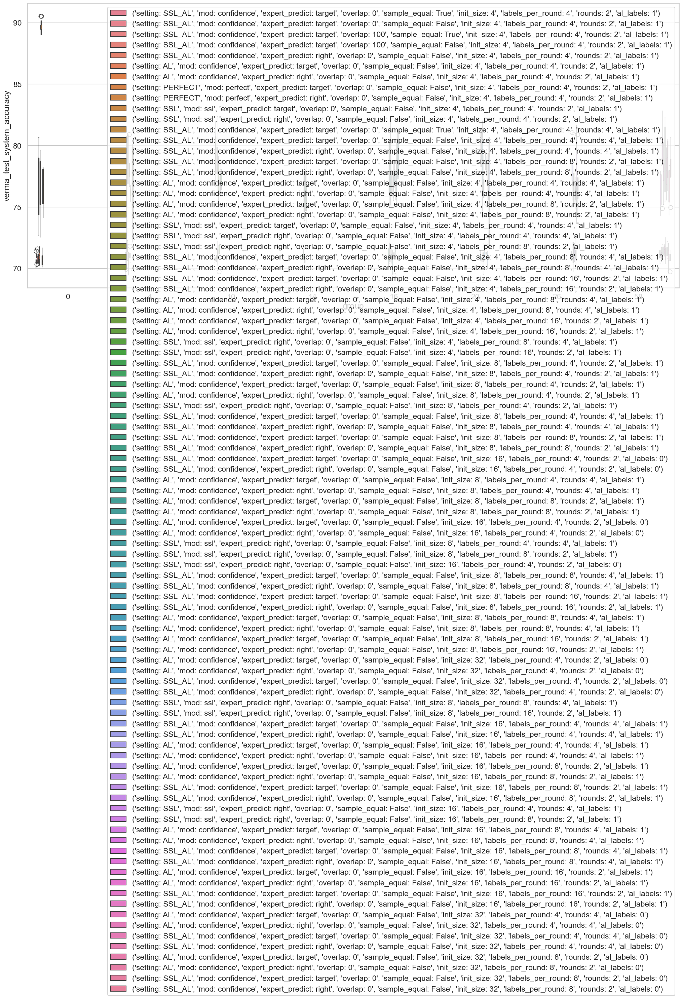

In [58]:
grouped_columns = []
cut_out = []#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "init_size", "labels_per_round", "rounds", "al_labels"]#, "expert_predict"]

method = "verma"
metric_name = "system_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

#selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
#group_test = group_ttest(df)

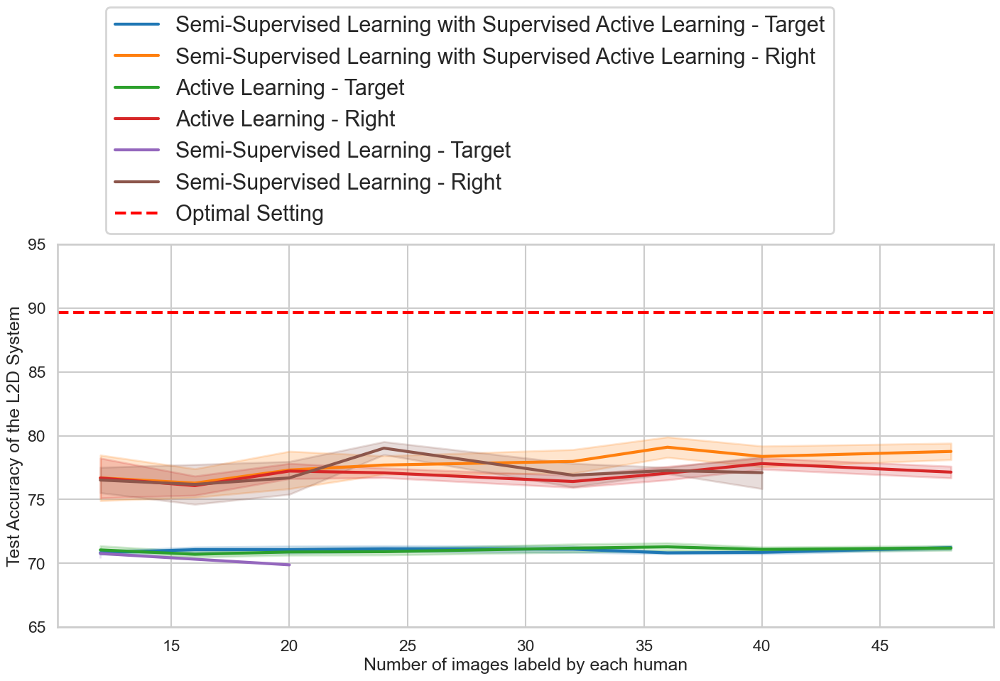

In [59]:
build_df = df.copy()

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1.0))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(65, 95))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='lower left', bbox_to_anchor=(0.04, 1))
leg_texts = ["Semi-Supervised Learning with Supervised Active Learning - Target", "Semi-Supervised Learning with Supervised Active Learning - Right", "Active Learning - Target", "Active Learning - Right", "Semi-Supervised Learning - Target", "Semi-Supervised Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_setting.png", bbox_inches="tight")

In [60]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b = b.reset_index()
b["expert_predict"] = "perfect"

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/CIFAR/overall_setting_acc.csv")
pivoted_df

setting expert_predict    mean                                        \
group                               0        12      16       20         24   
0           AL          right     NaN  76.68500  76.085  77.2300  77.090000   
1           AL         target     NaN  71.05000  70.705  70.8900  70.910000   
2      PERFECT        perfect  89.672       NaN     NaN      NaN        NaN   
3          SSL          right     NaN  76.52500  76.185  76.6950  79.025000   
4          SSL         target     NaN  70.76500     NaN  69.8800        NaN   
5       SSL_AL          right     NaN  76.69500  76.285  77.3125  77.703333   
6       SSL_AL         target     NaN  70.83125  71.070  71.0680  71.140000   

                                                   std                      \
group       32       36         40        48         0        12        16   
0      76.4125  77.0625  77.815000  77.14625       NaN  3.113257  1.502653   
1      71.1875  71.2900  71.088333  71.19500       NaN  0.633404  0.440719   
2          NaN      NaN        NaN       NaN  0.386564       NaN       NaN   
3      76.9050  77.2700  77.105000       NaN       NaN  1.990938  3.120828   
4          NaN      NaN        NaN       NaN       NaN  0.687677       NaN   
5      77.9850  79.1000  78.375000  78.76750       NaN  3.571494  2.239725   
6      71.1075  70.8200  70.861667  71.22500       NaN  0.500451  0.404145   

                                                                   
group        20        24        32        36        40        48  
0      1.682481  1.305387  1.326173  1.489446  1.523898  1.830041  
1      0.715382  0.892168  0.910130  0.882982  0.639173  0.731555  
2           NaN       NaN       NaN       NaN       NaN       NaN  
3      3.638724  1.757708  2.611464  0.700122  3.559209       NaN  
4           NaN       NaN       NaN       NaN       NaN       NaN  
5      4.149946  2.497939  2.625670  2.264761  2.819054  2.585466  
6      0.874945  0.799090  0.693804  0.207020  0.427037  0.589395

In [68]:
pivoted_df = pivoted_df[pivoted_df["setting"] != "PERFECT"]
pivoted_df.loc[[3, 5],["mean", "std"]].pct_change().loc[:,"mean"].iloc[:,1:].mean(axis=1)*100

3         NaN
5    0.700833
dtype: float64

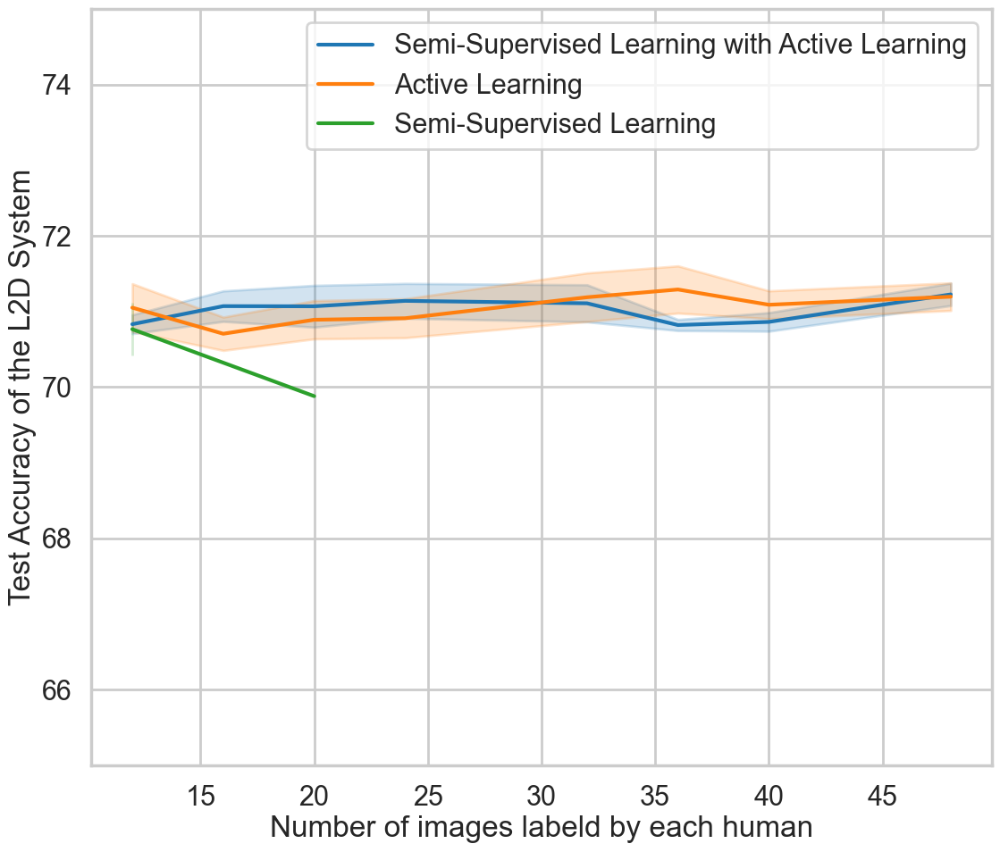

In [22]:
build_df = df.copy()

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1.0))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
#ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(65, 75))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend()
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_setting_target.png", bbox_inches="tight")

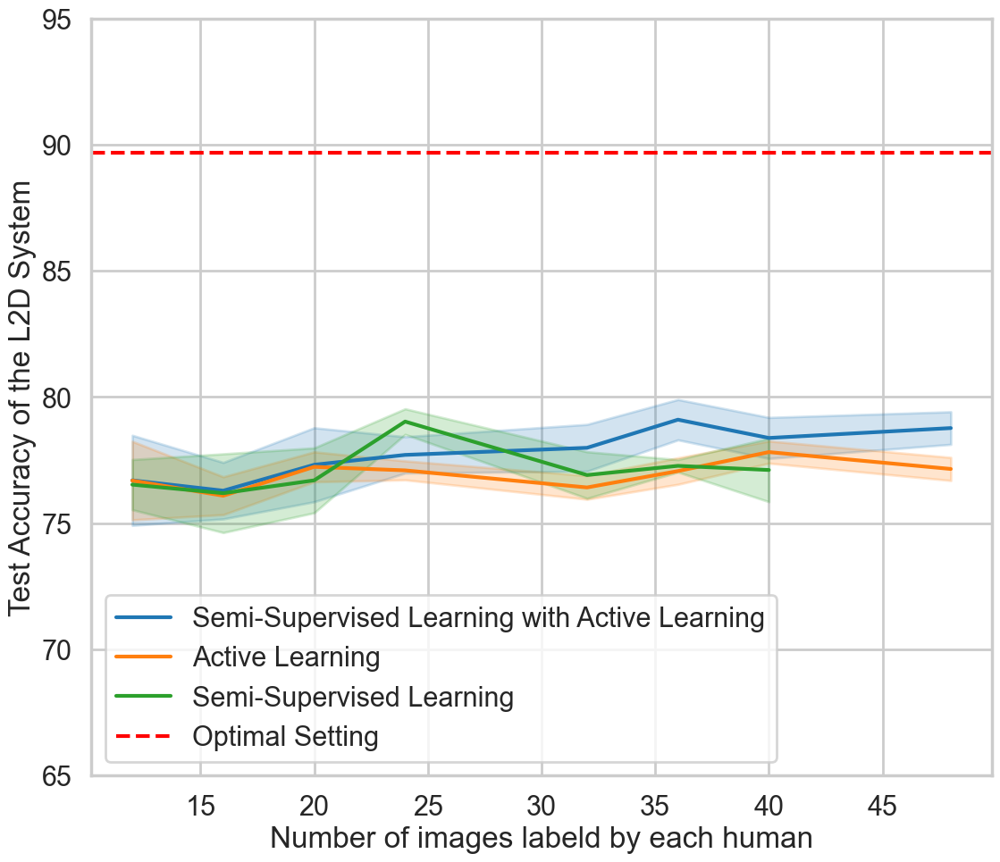

In [24]:
build_df = df.copy()

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1.0))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(65, 95))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend()
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_setting_right.png", bbox_inches="tight")

In [22]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, scipy.stats.iqr, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "iqr", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/CIFAR/overall_setting_acc.csv")
pivoted_df

setting   iqr                                                     mean  \
group            12     16    20     24     32     36     40     48       12   
0          AL  5.58  4.655  5.69  5.870  4.790  4.695  7.215  6.255  73.8675   
1         SSL  5.54  2.345  7.66  2.625    NaN  1.030  3.045    NaN  73.6450   
2      SSL_AL  1.13  4.570  6.88  5.670  6.675  7.525  8.445  7.555  72.0040   

       ... median             std                                          \
group  ...     40     48       12        16        20        24        32   
0      ...  73.65  73.42  3.66035  3.052994  3.504093  3.340492  2.913326   
1      ...  78.01    NaN  3.37354  3.120828  4.092156  1.715451       NaN   
2      ...  72.85  73.54  2.82890  3.160731  4.206087  3.811451  4.006899   

                                     
group        36        40        48  
0      3.207011  3.620756  3.319553  
1      0.700122  3.559209       NaN  
2      4.549268  4.314408  4.252494  

[3 rows x 33 columns]

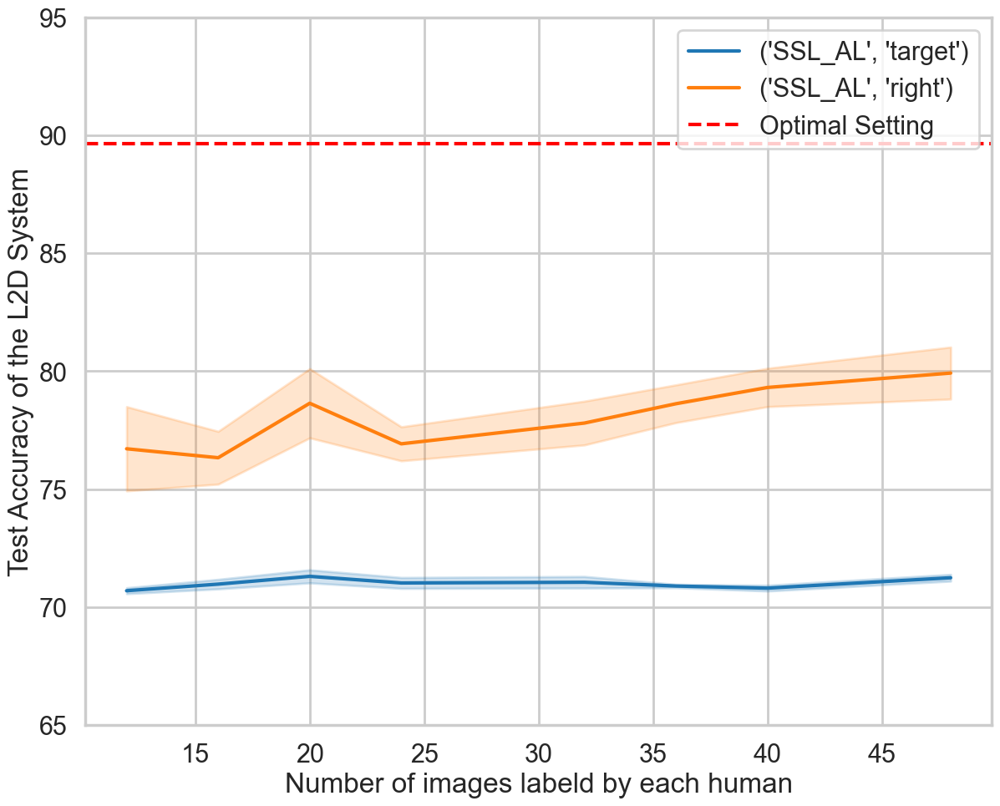

In [34]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(14, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(65, 95))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - If correct"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/CIFAR/model_strategy.png")

# Other metrics

In [25]:
metricManager.get_l2d_dataframe("verma", "test").columns

Index(['coverage', 'system_accuracy', 'expert_accuracy', 'classifier_accuracy',
       'alone_classifier', 'validation_loss', 'n_experts', 'expert_0',
       'expert_1', 'expert_0_coverage', 'expert_1_coverage', 'cov_classifier',
       'coverage_frac'],
      dtype='object')

In [69]:
df_runs = metricManager.runs

,al_labels,labeled
0,1,12
4,1,20
10,1,36
14,1,16
16,1,24
20,1,40
24,0,24
26,1,32
58,1,48
66,0,40


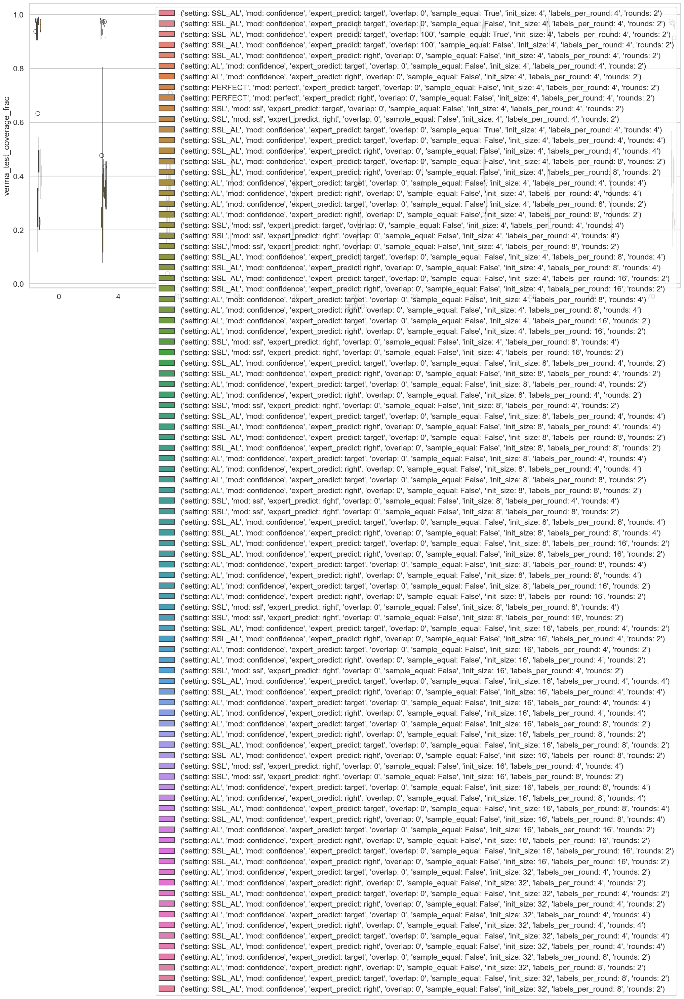

In [70]:
grouped_columns = []
cut_out = []#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "coverage_frac"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_overlap = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_overlap, selected_runs_overlap = get_runs_grouped_metric(df_runs.iloc[:], df_test_overlap, grouped_columns, False, cut_out)

#selected_runs_overlap["labeler_ids"] = selected_runs_overlap["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_overlap.columns = [str(name) for name in df_grouped_metrics_overlap.columns]

df_overlap, runs_df_overlap, series_overlap = plot_runs_hue_metric(selected_runs_overlap, df_grouped_metrics_overlap, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
#group_test = group_ttest(df)

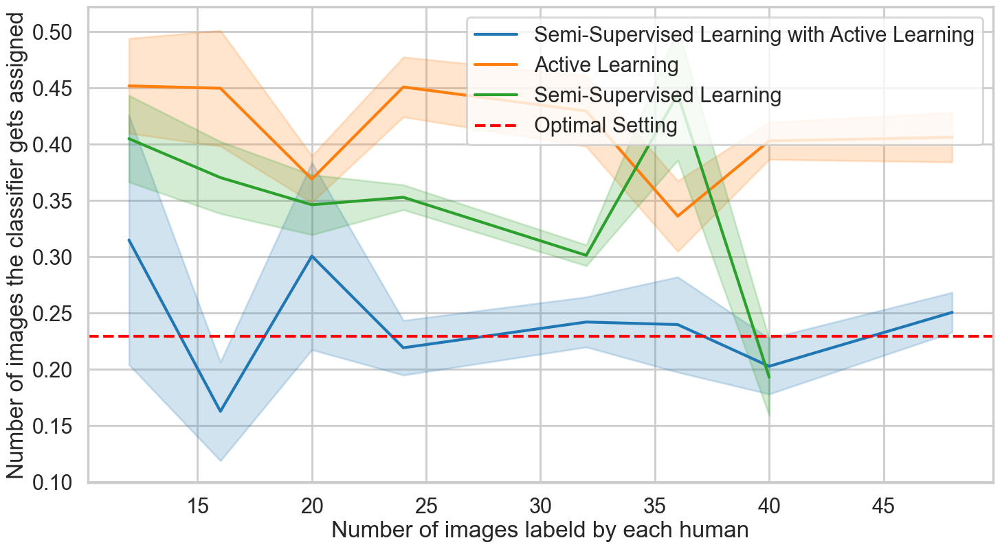

In [150]:
build_df = df_overlap.copy()
#Set ids

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
#ax.set(ylim=(0, 90))

ax.set(xlabel='Number of images labeld by each human', ylabel="Number of images the classifier gets assigned")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_clf_cov_right.png")

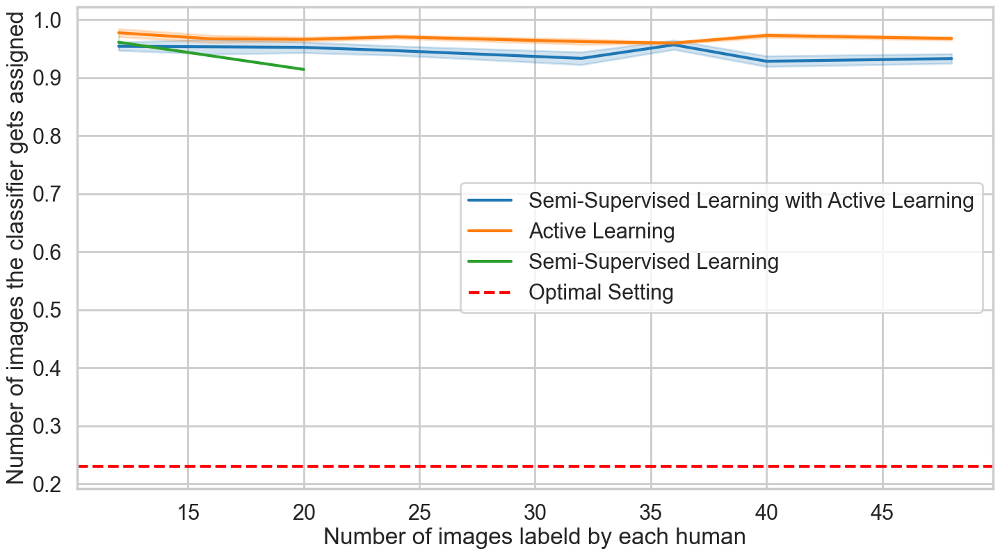

In [151]:
build_df = df_overlap.copy()
#Set ids

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
#ax.set(ylim=(0, 90))

ax.set(xlabel='Number of images labeld by each human', ylabel="Number of images the classifier gets assigned")
plt.legend()
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_clf_cov_target.png")

In [73]:
from scipy.stats import iqr

build_df = df_overlap.copy()
#Set ids

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b = b.reset_index()
b["expert_predict"] = "perfect"

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/CIFAR/overall_setting_clf_cov.csv")
pivoted_df

setting expert_predict     mean                                         \
group                                0        12       16        20        24   
0           AL          right      NaN  0.452000  0.44990  0.369200  0.451017   
1           AL         target      NaN  0.977400  0.96700  0.966025  0.970350   
2      PERFECT        perfect  0.22946       NaN      NaN       NaN       NaN   
3          SSL          right      NaN  0.405050  0.37050  0.346350  0.353000   
4          SSL         target      NaN  0.961100      NaN  0.914200       NaN   
5       SSL_AL          right      NaN  0.315000  0.16270  0.300725  0.219233   
6       SSL_AL         target      NaN  0.954113  0.95325  0.952220  0.946550   

                                                    std                      \
group        32        36        40        48         0        12        16   
0      0.429650  0.336250  0.403117  0.406363       NaN  0.084277  0.102836   
1      0.962125  0.959750  0.972783  0.967538       NaN  0.013735  0.012306   
2           NaN       NaN       NaN       NaN  0.014146       NaN       NaN   
3      0.301400  0.444550  0.193000       NaN       NaN  0.077000  0.064085   
4           NaN       NaN       NaN       NaN       NaN  0.024895       NaN   
5      0.242125  0.239850  0.202800  0.250713       NaN  0.221619  0.087791   
6      0.933300  0.956625  0.928283  0.932950       NaN  0.028231  0.025459   

                                                                   
group        20        24        32        36        40        48  
0      0.058532  0.092226  0.089081  0.088906  0.057086  0.088237  
1      0.010099  0.011228  0.013058  0.005144  0.012189  0.011455  
2           NaN       NaN       NaN       NaN       NaN       NaN  
3      0.075396  0.038339  0.026271  0.165569  0.096084       NaN  
4           NaN       NaN       NaN       NaN       NaN       NaN  
5      0.235446  0.084224  0.062994  0.119813  0.085661  0.071006  
6      0.029105  0.027654  0.030826  0.022901  0.031547  0.033226

In [108]:
((80-100)/100)*-1

0.2

In [119]:
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,1:]-0.22946)/0.22946).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

3    50.281406
dtype: float64

In [123]:
pivoted_df.loc[[5],["mean", "std"]]["mean"].iloc[:,1:].mean(axis=1)

5    0.241643
dtype: float64

In [ ]:
pivoted_df = pivoted_df[pivoted_df["setting"] != "PERFECT"]
pivoted_df.loc[[3, 5],["mean", "std"]].pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

,al_labels,labeled
0,1,12
4,1,20
10,1,36
14,1,16
16,1,24
20,1,40
24,0,24
26,1,32
58,1,48
66,0,40


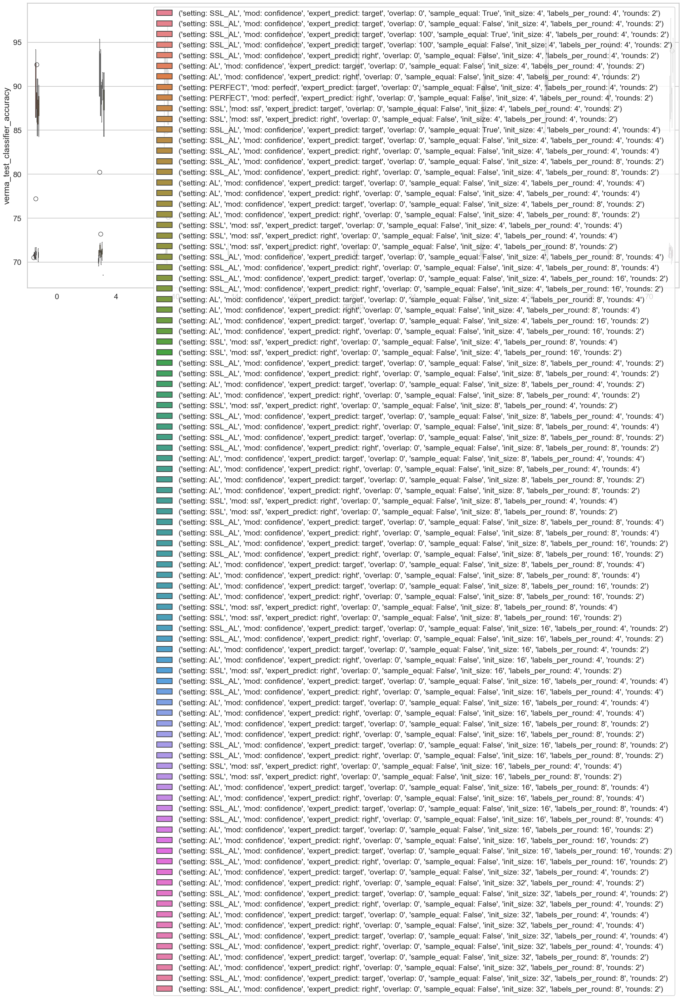

In [124]:
grouped_columns = []
cut_out = []#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal",  "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "classifier_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_classifier_accuracy = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_classifier_accuracy, selected_runs_classifier_accuracy = get_runs_grouped_metric(df_runs.iloc[:], df_test_classifier_accuracy, grouped_columns, False, cut_out)

#selected_runs_classifier_accuracy["labeler_ids"] = selected_runs_classifier_accuracy["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_classifier_accuracy.columns = [str(name) for name in df_grouped_metrics_classifier_accuracy.columns]

df_classifier_accuracy, runs_df_classifier_accuracy, series_classifier_accuracy = plot_runs_hue_metric(selected_runs_classifier_accuracy, df_grouped_metrics_classifier_accuracy, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
#group_test = group_ttest(df)

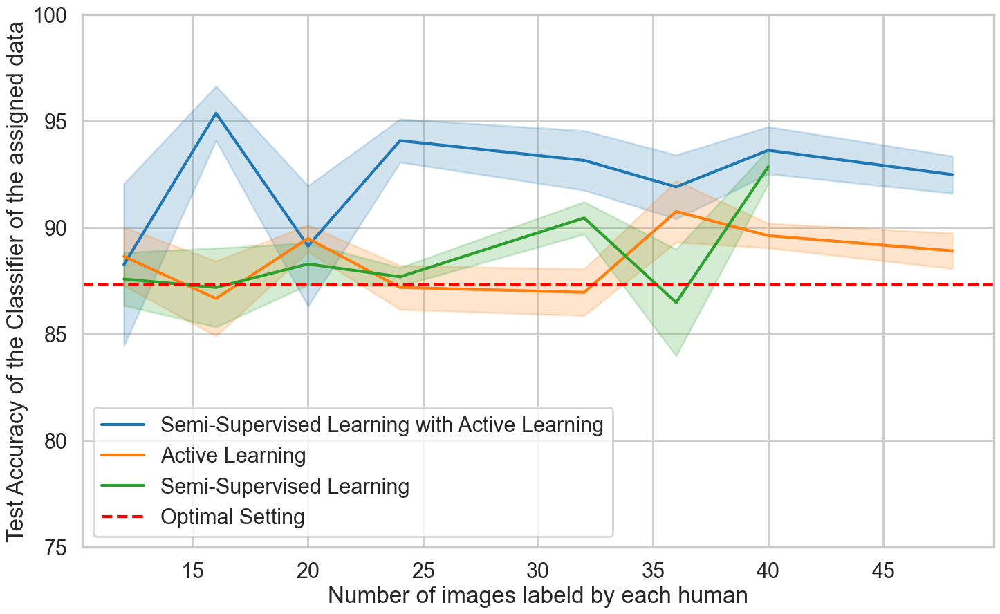

In [153]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(wide_format_h[0], 10))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(75, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the Classifier of the assigned data")
plt.legend()
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_clf_acc_right.png")

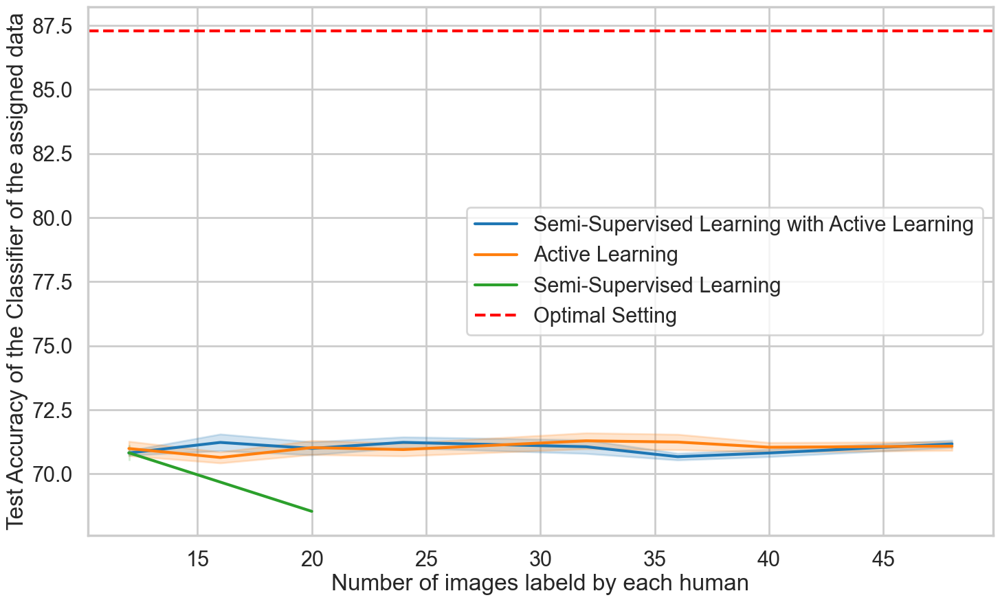

In [154]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(wide_format_h[0], 10))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
#ax.set(ylim=(75, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the Classifier of the assigned data")
plt.legend()
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_clf_acc_target.png")

In [127]:
from scipy.stats import iqr

build_df = df_classifier_accuracy.copy()
#Set ids

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b = b.reset_index()
b["expert_predict"] = "perfect"

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/CIFAR/overall_setting_clf_acc.csv")
pivoted_df

setting expert_predict      mean                                   \
group                                 0         12         16         20   
0           AL          right       NaN  88.641254  86.662375  89.481716   
1           AL         target       NaN  70.991983  70.642957  71.027212   
2      PERFECT        perfect  87.29097        NaN        NaN        NaN   
3          SSL          right       NaN  87.577065  87.181123  88.284173   
4          SSL         target       NaN  70.824442        NaN  68.540799   
5       SSL_AL          right       NaN  88.250668  95.364403  89.127674   
6       SSL_AL         target       NaN  70.817950  71.230275  70.996907   

                                                                   std  \
group         24         32         36         40         48         0   
0      87.182243  86.953280  90.747003  89.615184  88.900975       NaN   
1      70.951278  71.291874  71.244427  71.042044  71.084469       NaN   
2            NaN        NaN        NaN        NaN        NaN  1.907186   
3      87.682035  90.443262  86.471982  92.846544        NaN       NaN   
4            NaN        NaN        NaN        NaN        NaN       NaN   
5      94.075669  93.146062  91.903207  93.621823  92.479302       NaN   
6      71.231615  71.061086  70.673357  70.817860  71.171939       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      2.753203  3.520032  1.760799  3.566772  3.093569  4.088140  1.998577   
1      0.562111  0.432019  0.773623  0.870097  0.875939  0.853487  0.637802   
2           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3      2.488246  3.701910  2.778774  1.491518  2.147388  7.080098  2.256095   
4      0.628348       NaN       NaN       NaN       NaN       NaN       NaN   
5      7.601157  2.546087  7.992561  3.507537  3.957461  4.242185  3.835035   
6      0.364164  0.651621  0.799635  0.736290  0.750483  0.369049  0.501331   

                 
group        48  
0      3.328773  
1      0.675137  
2           NaN  
3           NaN  
4           NaN  
5      3.502359  
6      0.573807

In [ ]:
pivoted_df = pivoted_df[pivoted_df["setting"] != "PERFECT"]
pivoted_df.loc[[5],["mean", "std"]].pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

In [135]:
pivoted_df.loc[[5],["mean", "std"]]["mean"].iloc[:,1:].mean(axis=1)

5    92.246101
dtype: float64

In [131]:
((pivoted_df.loc[[5],["mean"]]["mean"].iloc[:,1:]-87.29097)/87.29097).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

5    5.676568
dtype: float64

In [29]:
dff["value"].max()

99.99983606584252

,al_labels,labeled
0,1,12
4,1,20
10,1,36
14,1,16
16,1,24
20,1,40
24,0,24
26,1,32
58,1,48
66,0,40


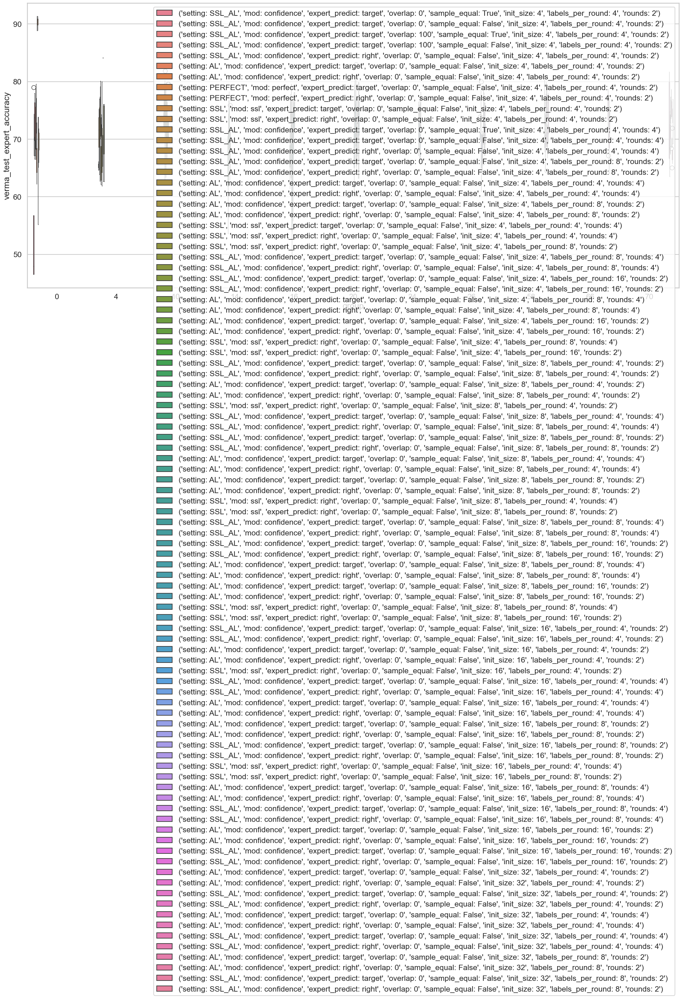

In [136]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "expert_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_expert_accuracy = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_expert_accuracy, selected_runs_expert_accuracy = get_runs_grouped_metric(df_runs.iloc[:], df_test_expert_accuracy, grouped_columns, False, cut_out)

#selected_runs_expert_accuracy["labeler_ids"] = selected_runs_expert_accuracy["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_expert_accuracy.columns = [str(name) for name in df_grouped_metrics_expert_accuracy.columns]

df_expert_accuracy, runs_df_expert_accuracy, series_expert_accuracy = plot_runs_hue_metric(selected_runs_expert_accuracy, df_grouped_metrics_expert_accuracy, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
#group_test = group_ttest(df)

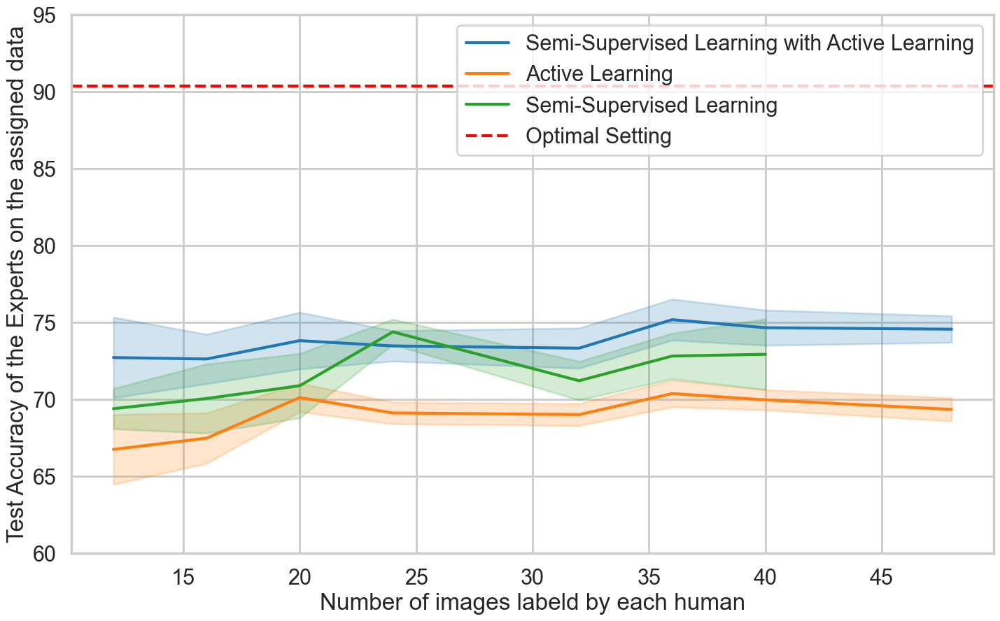

In [155]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(wide_format_h[0], 10))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(60, 95))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the Experts on the assigned data")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_expert_acc_rigth.png")

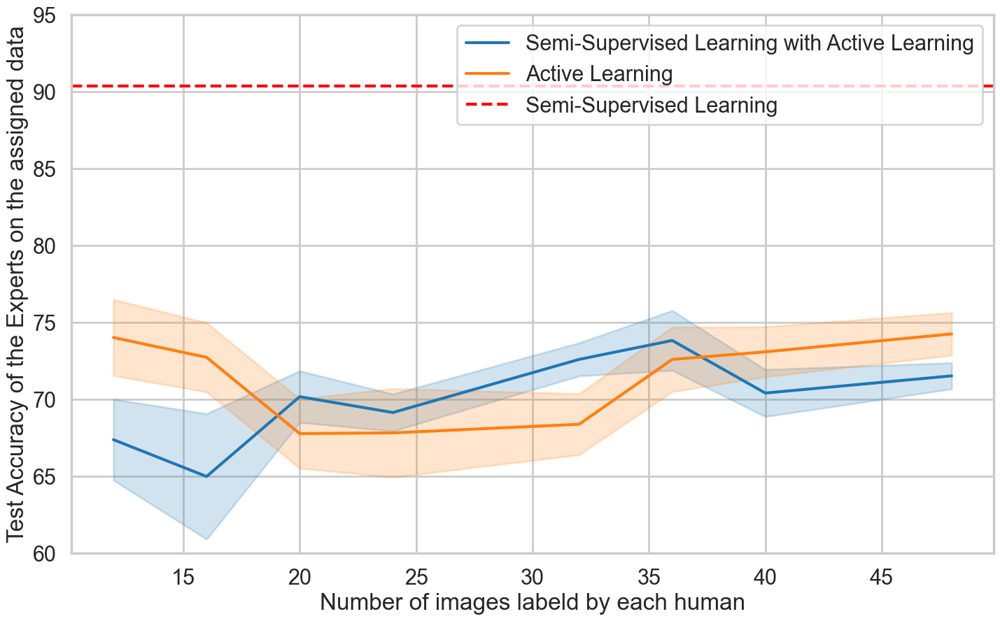

In [156]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(wide_format_h[0], 10))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(60, 95))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the Experts on the assigned data")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/overall_expert_acc_target.png")

In [139]:
from scipy.stats import iqr

build_df = df_expert_accuracy.copy()
#Set ids

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b = b.reset_index()
b["expert_predict"] = "perfect"

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/CIFAR/overall_setting_expert_acc.csv")
pivoted_df.round(2)

setting expert_predict   mean                                     \
group                              0     12     16     20     24     32   
0           AL          right    NaN  66.74  67.47  70.11  69.11  69.00   
1           AL         target    NaN  74.01  72.73  67.77  67.81  68.37   
2      PERFECT        perfect  90.37    NaN    NaN    NaN    NaN    NaN   
3          SSL          right    NaN  69.39  70.05  70.88  74.38  71.20   
4          SSL         target    NaN  67.83    NaN  84.15    NaN    NaN   
5       SSL_AL          right    NaN  72.71  72.62  73.81  73.47  73.32   
6       SSL_AL         target    NaN  67.37  64.98  70.17  69.14  72.59   

                             std                                             \
group     36     40     48     0     12    16    20    24    32    36    40   
0      70.37  69.96  69.34   NaN   4.55  3.27  2.62  2.45  2.04  2.47  2.28   
1      72.59  73.08  74.25   NaN   4.95  4.49  6.37  9.97  5.61  5.92  5.63   
2        NaN    NaN    NaN  0.71    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
3      72.81  72.92    NaN   NaN   2.62  4.49  5.91  2.84  3.56  4.19  6.50   
4        NaN    NaN    NaN   NaN   8.82   NaN   NaN   NaN   NaN   NaN   NaN   
5      75.17  74.65  74.55   NaN   5.25  3.21  5.21  3.43  3.70  3.77  3.97   
6      73.82  70.40  71.52   NaN  10.53  8.16  5.30  4.17  3.04  5.50  5.30   

             
group    48  
0      3.03  
1      5.54  
2       NaN  
3       NaN  
4       NaN  
5      3.45  
6      3.40

In [ ]:
pivoted_df = pivoted_df[pivoted_df["setting"] != "PERFECT"]
pivoted_df.loc[[5],["mean", "std"]].pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

In [146]:
pivoted_df.loc[[3, 5],["mean", "std"]]["mean"].iloc[:,1:].pct_change().mean(axis=1)*100

3         NaN
5    2.850597
dtype: float64

In [131]:
((pivoted_df.loc[[5],["mean"]]["mean"].iloc[:,1:]-87.29097)/87.29097).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

5    5.676568
dtype: float64

## Playground

[(80.0, 100.0)]

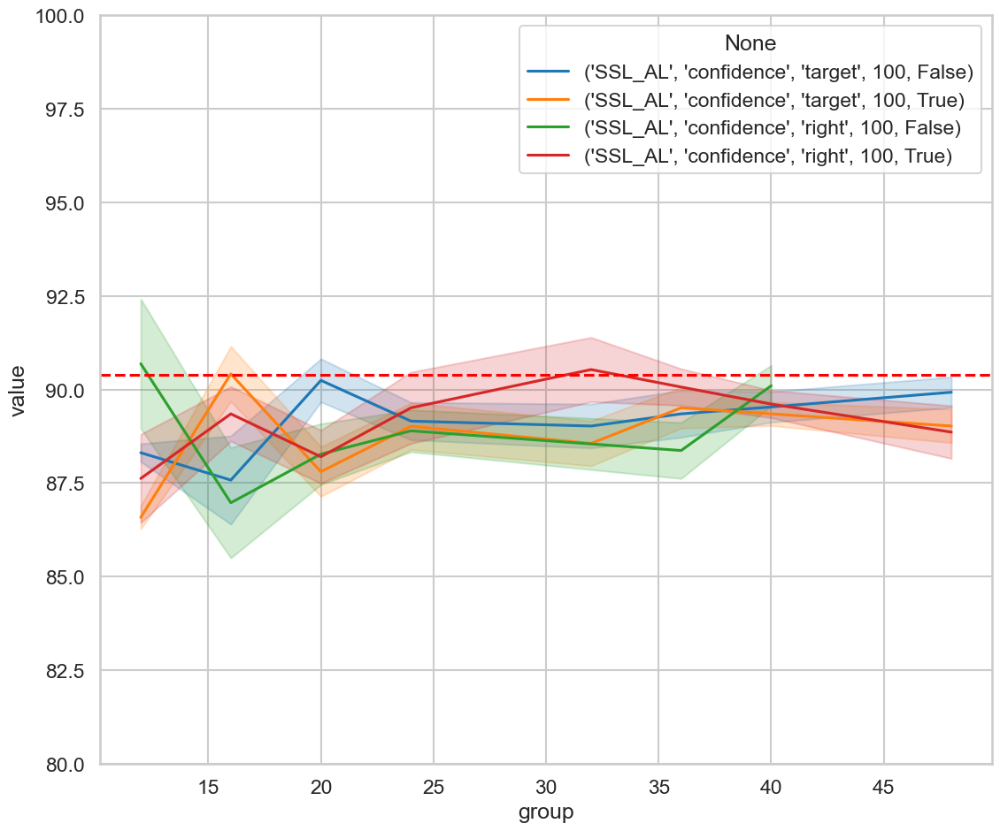

In [25]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
#dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

[(80.0, 100.0)]

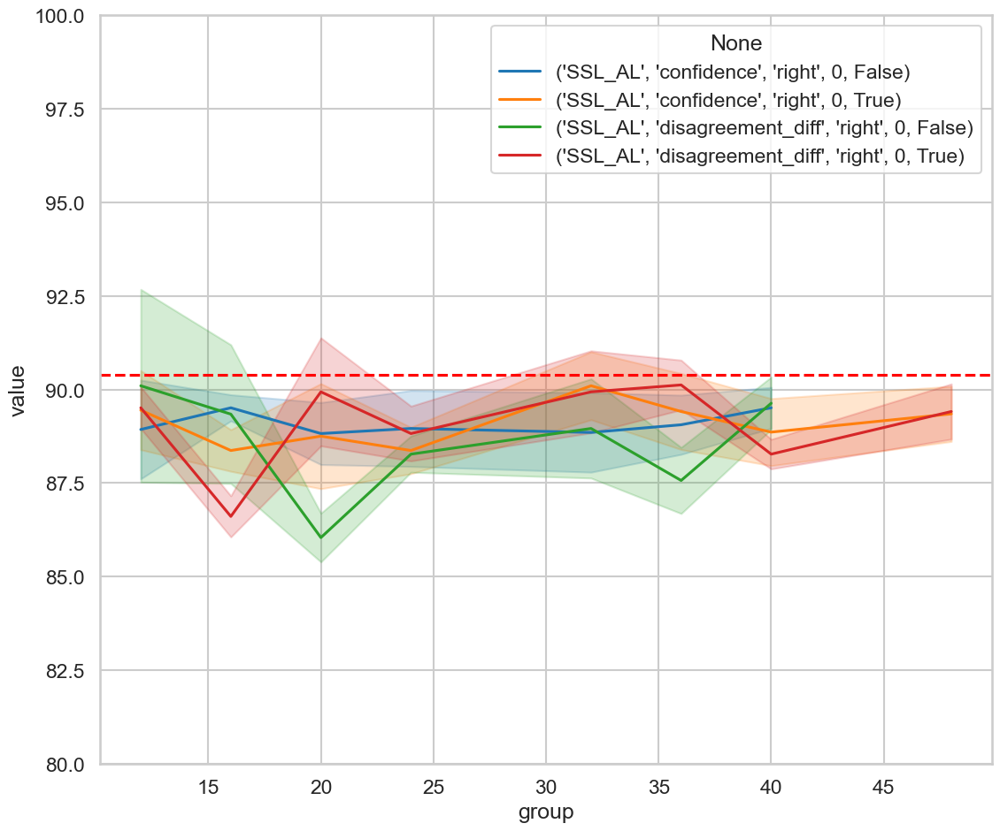

In [26]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] != 100]
#dff = dff[dff["sample_equal"] != False]
#dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

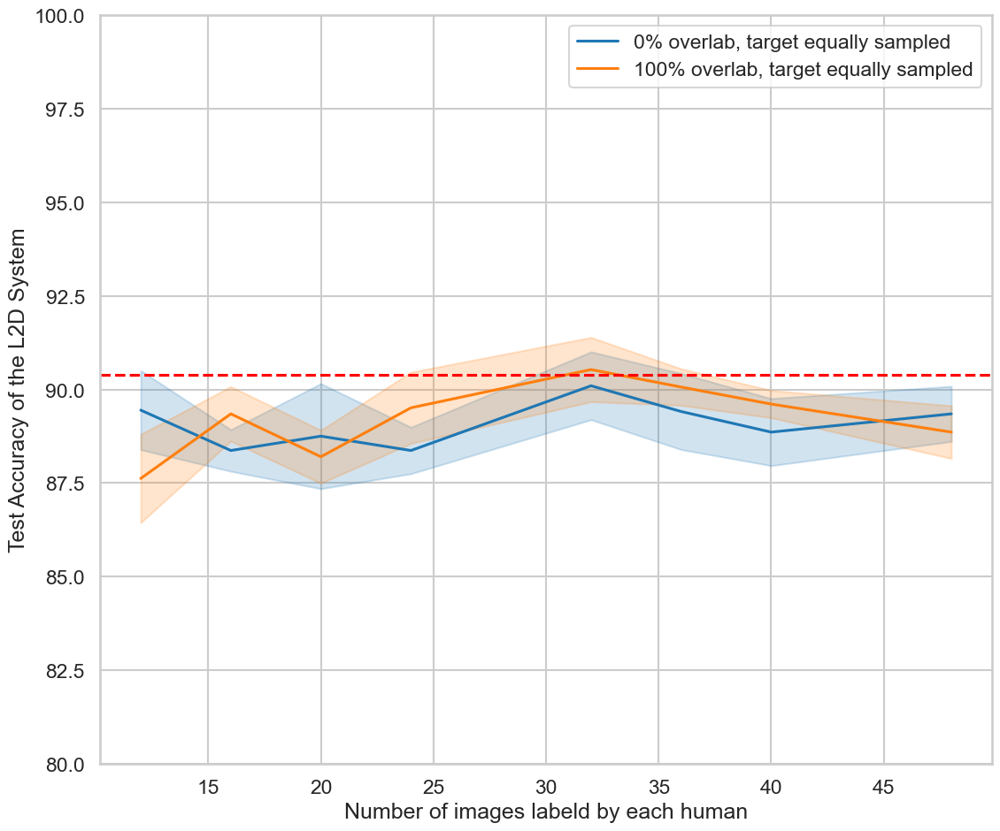

In [35]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target equally sampled", "100% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

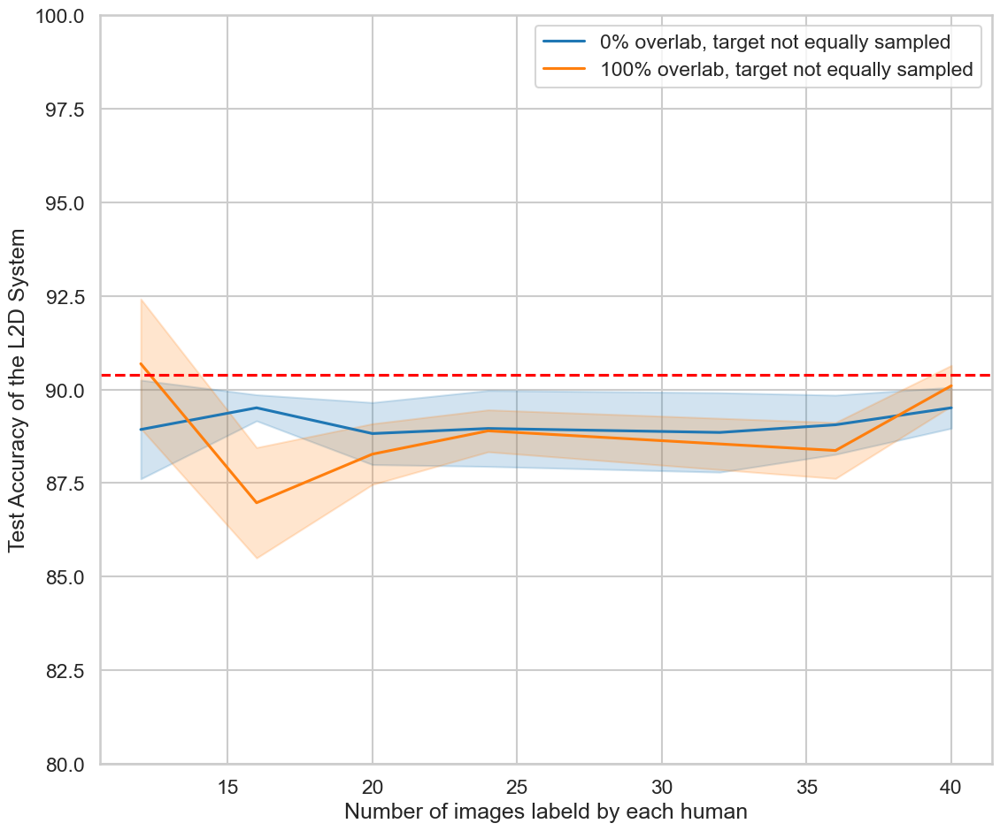

In [38]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != True]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target not equally sampled", "100% overlab, target not equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

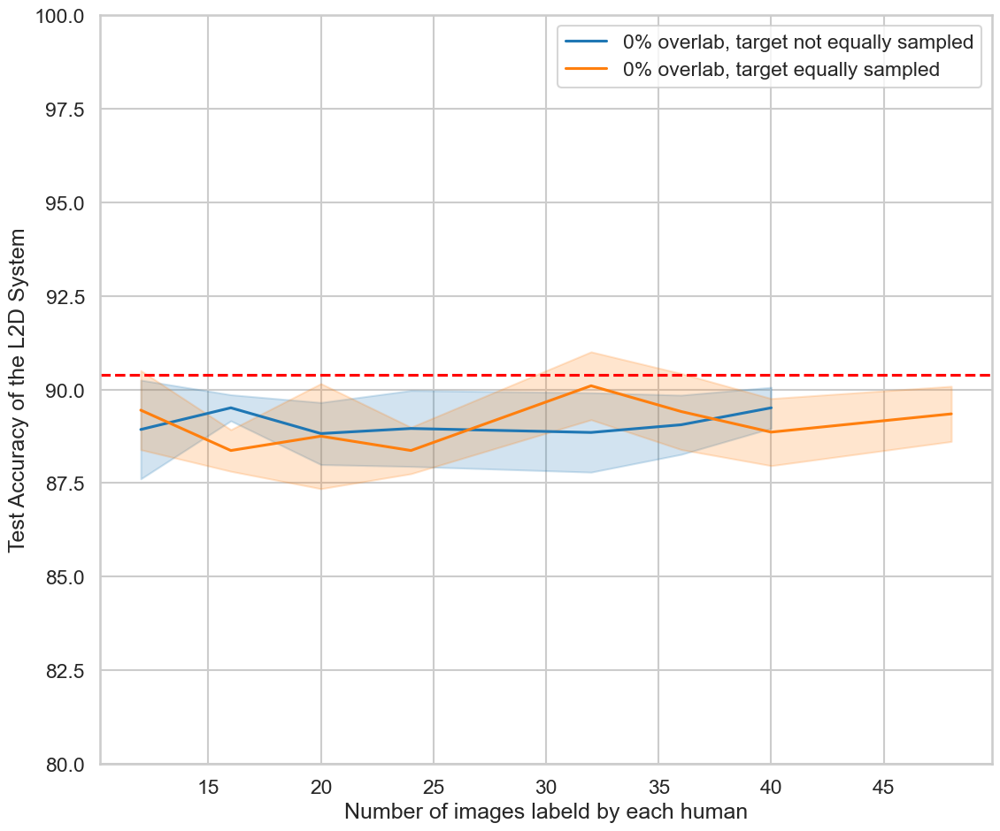

In [47]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target not equally sampled", "0% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

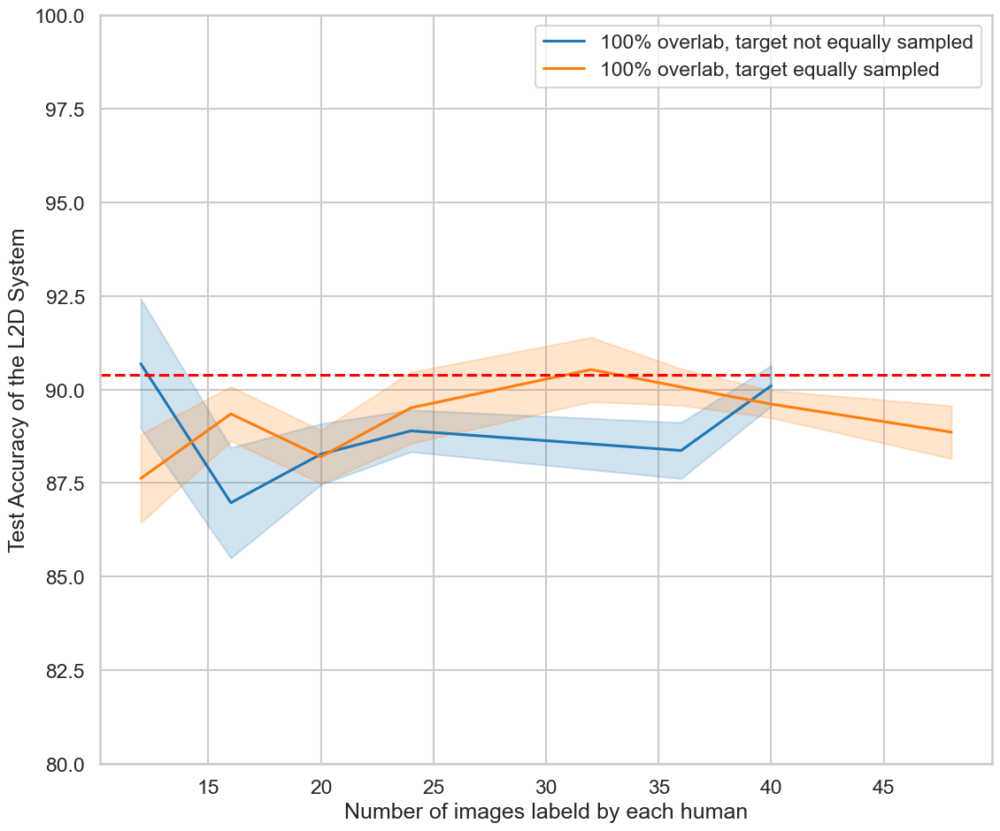

In [49]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "sample_equal", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["100% overlab, target not equally sampled", "100% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

In [58]:
dfff["group"].unique()

array([  0, 193], dtype=int64)

In [17]:
dff.to_excel("bac.xlsx")

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement"), ("labeler_ids", "[4295342357, 4295354117]"), ("labeler_ids", "[4323195249, 4295232296]")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "labeler_ids"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
dff = df[df["group"] != 0].reset_index()
dfff = df[df["group"] == 0].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
f, ax = plt.subplots(figsize=(25, 11))
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue="setting", data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("sd", 0.5))
ax.axhline(dfff["value"].mean(), ls='--')
ax.set(ylim=(80, 95))

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "labeler_ids"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
dff = df[df["group"] != 0].reset_index()
dfff = df[df["group"] == 0].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff["setting"] = dff.apply(lambda x: f'{x["setting"]}_{x["labeler_ids"]}', axis=1)
f, ax = plt.subplots(figsize=(25, 11))
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#sns.lineplot(x="group", y="value", hue="setting", data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("sd", 0.5))
sns.lineplot(x="group", y="value", hue="setting", data=dff, markers=True)
ax.axhline(dfff["value"].mean(), ls='--')
ax.set(ylim=(80, 95))

In [ ]:
grouped_columns = ["init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement"), ("mod", "disagreement_diff"),
           ("labeler_ids", "[4295349121, 4295342357]"), ("labeler_ids", "[4323195249, 4295232296]"), 
           ("setting", "AL"), ("setting", "SSL"), ("setting", "SSL_AL_SSL"), ("setting", "NORMAL"),]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "sample_equal", "overlap"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds", "labeler_ids"]
#cut_out = [("expert_predict", "right"), ("mod", "disagreement")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager_cifar.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs_cifar.iloc[:], df_test, grouped_columns, False, cut_out)

#selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
group_test = group_ttest(df)

# Analysis

In [ ]:
metricManager.get_l2d_dataframe("verma", "val").columns

In [ ]:
metricManager.get_l2d_dataframe("hemmer", "val").columns

In [ ]:
exclude = [("expert_predict", "right")]
#exclude = None

df_accuracy = metricManager.get_metrics_dataframe_cut("verma", "test", "system_accuracy", exclude)
f, ax = plt.subplots(figsize=(70, 11))
ax.set(xlabel='Run', ylabel='Val System Accuracy')
box = sns.boxplot(df_accuracy)
plt.show()
box.figure.savefig("all_runs.png")

df_ttests = pd.DataFrame(check_all_ttest(df_accuracy))
# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(25, 11))
sns.heatmap(df_ttests, annot=True, linewidths=.5, ax=ax)

df_runs.loc[[int(el) for el in df_accuracy.columns]]

In [ ]:
import matplotlib.ticker as ticker

def row_to_name(row):
    result = row["setting"] + "_"
    row = row.drop("setting")
    for col in row:
        result += str(col) + "_"
    return result[:-1]

In [ ]:
df_verma = df.copy()
df_ver = df_verma.melt(var_name='run')
df_ver["method"] = ["verma" for i in range(len(df_verma.melt()))]
df_ver

In [ ]:
df_hemmer = df.copy()
df_hem = df_hemmer.melt(var_name='run')
df_hem["method"] = ["hemmer" for i in range(len(df_hemmer.melt()))]
df_hem

In [ ]:
df = pd.concat([df_ver, df_hem])

sns.set_style("whitegrid")
sns.set_context("poster")
f, ax = plt.subplots(figsize=(25, 9))
box_plot = sns.boxplot(df, x="run", y="value", hue="method")
#box_plot.tick_params(labelsize=5)

labels = [row_to_name(selected_runs.loc[x]) for x in selected_runs.index]
labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
ax.set_xticks(ax.get_xticks(), labels)
ax.set(xlabel='Group', ylabel=f"{method}_{step}_{metric_name}")

#plt.axhline(df[0].median(), color='r') # horizontal

#for tick in ax.xaxis.get_major_ticks()[1::2]:
    #tick.set_pad(35)

plt.xticks(rotation=45)
box_plot.figure.savefig("all_runs_grouped_cutRightDisagreementdiff.png", bbox_inches='tight')
plt.show()

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round", "mod"]
cut_out = [("setting", "SSL_AL_SSL"), ("setting", "NORMAL")]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, var_columns, False, cut_out)


sns.set_style("whitegrid")
sns.set_context("poster")
f, ax = plt.subplots(figsize=(22, 9))
box_plot = sns.boxplot(df)
#box_plot.tick_params(labelsize=5)

labels = [row_to_name(selected_runs.loc[x]) for x in selected_runs.index]
labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
ax.set_xticks(ax.get_xticks(), labels)
#ax.set(xlabel='Training method', ylabel=f"{method}_{step}_{metric_name}")
ax.set(xlabel='Training method', ylabel=f"System Accuracy")

plt.axhline(df[0].median(), color='r') # horizontal

#for tick in ax.xaxis.get_major_ticks()[1::2]:
    #tick.set_pad(35)

plt.xticks(rotation=45)
box_plot.figure.savefig("all_runs_grouped_cutRightDisagreementdiff.svg", bbox_inches='tight', format="svg")
plt.show()
#

m, test_plot = check_all_ttest(df, plot=True)
test_plot.get_figure().savefig("Images/ttest_all_runs_grouped_cutRightDisagreementDisagreementdiff.png")

selected_runs.head(70)

In [ ]:
var_columns = ["sample_equal", "overlap", "cost", "labeled"]

cut_out = [("expert_predict", "right")]

df_test = cut_column_name(metricManager.get_metric_dataframe("verma", "val", "system_accuracy"))
df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_test, var_columns, cut_out)
group_test = group_ttest(df)

In [ ]:
var_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("setting", "AL"), ("setting", "NORMAL"), ("mod", "disagreement"), ("setting", "SSL"), ("setting", "SSL_AL_SSL"), ("mod", "disagreement_diff")]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df, runs_df, series = plot_runs_hue_metric(df_runs.iloc[:], df_test, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", sorted_columns=["labeled"])
group_test = group_ttest(df)

In [ ]:
def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1

get_index_from_tuple(li[0], "labeled")

In [ ]:
sorted_names = ["labeled", "init_size", "overlap"]
sorted_by_second = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in sorted_names]]))
ser = pd.Series(sorted_by_second)
ser.head()

def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1

In [ ]:
def plot_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None, y_text="value", sorted_columns=None, size=(15, 8)):
    df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_metrics, var_columns, unwanted_tuples)

    #f, ax = plt.subplots(figsize=size)
    f, ax = plt.subplots(1, 2, figsize=size, gridspec_kw=dict(width_ratios=[1, 9]))

    df_perfect = df[df["group"] == 0]
    df = df[df["group"] != 0]

    #f = plt.figure()

    #ax = f.add_subplot(2, 2, 1)

    display(HTML(runs_df.to_html()))

    ax[0].set(ylim=(70, 97))
    ax[1].set(ylim=(70, 97))

    #lis = sorted(df[var_columns].apply(tuple, axis=1), key=lambda tup: tup[0])
    lis = df[var_columns].apply(tuple, axis=1)
    sort = sorted(list(lis.unique()), key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(var_columns, name) for name in var_columns]]))

    g = sns.boxplot(df_perfect, y="value", x="group", ax=ax[0])
    g = sns.boxplot(df, y="value", x="group", hue=lis, hue_order=sort, ax=ax[1])

    #ax[0].set(xlabel='', ylabel=y_text)
    ax[0].set(xlabel='', ylabel="System accuracy")
    ax[1].set(xlabel='', ylabel="")

    series = pd.Series(df[var_columns].apply(tuple, axis=1))
    for i in range(len(var_columns)):
        name = var_columns[i]
        for j, el in enumerate(series):
            el = list(series.iloc[j])
            if name == "labeled":
                name += " images"
            el[i] = f"{name}: {el[i]}"
            series.iloc[j] = tuple(el)

    li = list(series.unique())
    sorted_list = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in var_columns]]))

    plt.legend(loc='lower right', ncol=2)
    #plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

    #labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
    ax[0].set_xticks(ax[0].get_xticks(), ["Perfect"])
    ax[1].set_xticks(ax[1].get_xticks(), ["SSL + AL"])
    
    for t, l in zip(g.legend_.texts, sorted_list):
        #print(l)
        #print(cut_hue_legend(str(l)))
        t.set_text(cut_hue_legend(str(l)))
        #t.set_text(l)

    f.tight_layout()
    f.savefig("labeled_images.svg", bbox_inches='tight', format="svg")
    plt.show(g)

    return df, runs_df, lis

In [ ]:
def cut_hue_legend(name):
    return name.replace(",", "").replace("(", "").replace(")", "")

In [ ]:
grouped_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement"), ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("setting", "SSL_AL_SSL")]
var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff"), ("mod", "disagreement"),]
var_columns = ["labeled"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)



df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff"), ("mod", "disagreement"), ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("setting", "SSL_AL_SSL")]
var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
#group_test = group_ttest(df)

plt.show()

# Expert

In [8]:
class ExpertMetrics:
    def __init__(self, metrics):
        self.metric = metrics

        self.runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        
        self.runs["al_labels"] = self.runs.apply(lambda x: 1 if (x["labeled"]-x["init_size"])/x["labeled"] >= 0.5 else 0, axis=1)

        self.expert_values = {
            "Val": {},
            "Test": {},
        }

    def get_experts_in_run(self, run):
        """
        Returns a list of all expert ids in this run
        """
        seed = list(self.metric[run]["expert metrics"].keys())[0]
        fold = list(self.metric[run]["expert metrics"][seed].keys())[0]
        return list(self.metric[run]["expert metrics"][seed][fold].keys())

    def creat_expert_run(self, expertId, run, step, metric_name):
        """
        Creates a pd.DataFrame which consists of the start and end as columns and Seed_Fold as index
        """
        run_dict = {}
        for seed, value1 in self.metric[run]["expert metrics"].items():
            seed_dict = {}
            for fold, value2 in value1.items():
                expert_metric = value2[expertId][step]
                fold_dict = {}
                if metric_name in expert_metric["End"]:
                    fold_dict["End"] = expert_metric["End"][metric_name]
                else:
                    if metric_name == "f0.5":
                        fold_dict["End"] = f_beta_score(expert_metric["End"]["tp"], expert_metric["End"]["tn"], expert_metric["End"]["fp"], expert_metric["End"]["fn"], 0.5)
                    if metric_name in ["tp", "fp", "tn", "fn"]:
                        fold_dict["End"] = read_from_conv(expert_metric["End"]["conf_matrix"])[metric_name]
                if "Start" in expert_metric:
                    if metric_name in expert_metric["Start"]:
                        fold_dict["Start"] = expert_metric["Start"][metric_name]
                    else:
                        if metric_name == "f0.5":
                            fold_dict["Start"] = f_beta_score(expert_metric["Start"]["tp"], expert_metric["Start"]["tn"], expert_metric["Start"]["fp"], expert_metric["Start"]["fn"], 0.5)
                        if metric_name in ["tp", "fp", "tn", "fn"]:
                            fold_dict["Start"] = read_from_conv(expert_metric["Start"]["conf_matrix"])[metric_name]
                else:
                    if metric_name in expert_metric["End"]:
                        fold_dict["Start"] = expert_metric["End"][metric_name]
                    else:
                        if metric_name == "f0.5":
                            fold_dict["End"] = f_beta_score(expert_metric["End"]["tp"], expert_metric["End"]["tn"], expert_metric["End"]["fp"], expert_metric["End"]["fn"], 0.5)
                        if metric_name in ["tp", "fp", "tn", "fn"]:
                            fold_dict["End"] = read_from_conv(expert_metric["End"]["conf_matrix"])[metric_name]
                seed_dict[f"Fold_{fold}"] = pd.DataFrame(fold_dict, index=[0])
            run_dict[f"Seed_{seed}"] =  pd.concat(seed_dict, ignore_index=True)
        return pd.concat(run_dict)

    def create_expert_metric(self, expertId, step, metric_name):
        """
        Creates a multiindex Dataframe for one expert with start and end as columns and Run, Seed, Fold as index
        """
        run_metrics = {}
        for run_id in range(len(self.metric)):
            if expertId in self.metric[run_id]["labeler_ids"]:
                run_metrics[f"Run_{run_id}"] = self.creat_expert_run(expertId, run_id, step, metric_name)
        return pd.concat(run_metrics)

    def create_plot_df(self, expertId, step, metric_name, unwanted_tuples=None):
        """
        Generates a Dataframe to plot all runs (except with unwanted tuples) with start/end as hue
        """
        if unwanted_tuples is not None:
            runs = remove_unwanted_runs(self.runs, unwanted_tuples).index
        else:
            runs = self.runs.index

        df = expertMetrics.create_expert_metric(4323195249, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff.head()
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        return dff[dff["run"].isin(runs)]

    def create_plot_df_grouped(self, expertId, step, metric_name, var_columns, unwanted_tuples=None):
        """
        Generates a Dataframe to plot gruped runs (over var_columns aggregated) with start/end as hue
        """
        if unwanted_tuples is not None:
            df_runs = remove_unwanted_runs(self.runs, unwanted_tuples)
        else:
            df_runs = self.runs
        df_runs = runs_cost_to_string(df_runs)
    
        g_runs = get_runs_grouped(df_runs, var_columns, False)

        df = expertMetrics.create_expert_metric(expertId, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        dff["group"] = -1

        dff = dff[dff["run"].isin(df_runs.index)]
            
        dff["group"] = dff.apply(lambda row: g_runs[getGroupIndex(g_runs, row["run"])][0], axis=1)

        #keys are the columns of runs where the values are different in the aggregated runs
        #Prevents from printing column-values which are constant over all run groups
        temp1, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)

        first_indices = [group[0] for group in g_runs]

        #df.columns = df_runs.loc[first_indices, keys].index
    
        return dff, df_runs.loc[first_indices, keys]

    def create_plot_df_grouped_hue(self, expertId, step, metric_name, var_columns, fix_columns):
        """
        Creates a Dataframe for one fix set of parameters (fix_columns) grouped (aggregated over var_columns) and variable columns as different possibilities (single boxplots)
        Hue is start/end
        """
        if fix_columns is not None:
            df_runs = keep_wanted_runs(self.runs, fix_columns)
        else:
            print("default")
            df_runs = self.runs
        df_runs = runs_cost_to_string(df_runs)
    
        g_runs = get_runs_grouped(df_runs, var_columns, False)

        df = expertMetrics.create_expert_metric(expertId, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        dff["group"] = -1

        dff = dff[dff["run"].isin(df_runs.index)]
            
        dff["group"] = dff.apply(lambda row: g_runs[getGroupIndex(g_runs, row["run"])][0], axis=1)

        #keys are the columns of runs where the values are different in the aggregated runs
        #Prevents from printing column-values which are constant over all run groups
        temp1, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)

        first_indices = [group[0] for group in g_runs]

        #df.columns = df_runs.loc[first_indices, keys].index
    
        return dff, df_runs.loc[first_indices, keys]
        

    def print_metrics(self):
        print("tn, fp, fn, tp, accurancy, f1, accurancy_balanced")


def getGroupIndex(groups, x):
    for i in range(len(groups)):
        if x in groups[i]:
            return i
        
        
def f_beta_score(tp, tn, fp, fn, beta):
    if (tp + fp) == 0 or (tp + fn) == 0:
        return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    if (precision + recall) == 0:
        return 0
    f_beta = (1+beta**2) * ((precision * recall)/(beta**2 * precision + recall))
    return f_beta

def read_from_conv(conv_matrix):
    conv = conv_matrix.reshape(2, -1)
    tp = conv[0][0]
    fp = conv[0][1]
    tn = conv[1][0]
    fn = conv[1][1]
    return {"tp": tp, "fp": fp, "tn": tn, "fn": fn}

In [78]:
abc = {"test": 1}
"test" in abc

True

In [76]:
f_beta_score(10, 0, 0, 10, 1)

0.6666666666666666

In [79]:
import gc
gc.collect()

178492

In [9]:
#metricManager = MetricManager(metrics2)
df_runs = metricManager.runs
np.unique(df_runs["labeler_ids"].values)
expertMetrics = ExpertMetrics(metricManager.return_metrics_with_two().copy())#metrics2)

In [81]:
#metricManager.set_experts([4323195249, 4295232296])


expertMetrics = ExpertMetrics(metricManager.return_metrics_with_two().copy())#metrics2)

In [110]:
conv = np.array([ 2,  6, 21, 55])
te(conv)

(2, 6, 21, 55)

In [13]:
def read_from_conv(conv_matrix):
    conv = conv_matrix.reshape(2, -1)
    tp = conv[0][0]
    fp = conv[0][1]
    tn = conv[1][0]
    fn = conv[1][1]
    return tp, fp, tn, fn

In [38]:
ab = np.array([ 14,   5,   0,   0,   0,   0,   0,   0,   0,   0,  10, 244,   2,
         3,   0,   0,   3,   0,   0,   0,   5,  26,   0,   0,   3,   0,
         0,   0,   0,   0,  12, 270,   3,  10,   0,   0,   4,   0,   0,
         0,   0,   3,   0,   0,  10,   1,   0,   0,   0,   0,   8, 239,
         0,  37,   0,   0,  14,   0,   0,   0,   0,   0,   0,   0,   5,
         0,   0,   0,   0,   0,   1, 153,   1,  14,   0,   0,   1,   0,
         0,   0,   0,   4,   0,   0,  50,   0,   0,   0,   0,   0,   3,
       147,   2,  33,   0,   0,  16,   0,   0,   0,   1,   1,   0,   0,
         2,  20,   0,   0,   0,   0,   3, 152,   2,  14,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   3,   2,   0,   0,   0,   0,
         2, 231,   0,   8,   0,   0,   0,   0,   0,   0,   3,   2,   0,
         0,   2,   0,   1,   0,   0,   0,   1, 224,   1,  49,   0,   0,
         5,   0,   0,   0,   7,   2,   0,   0,   1,   0,   1,   0,   0,
         0,   5, 235,   5,   3,   0,   0,   5,   0,   0,   0,   0,   2,
         0,   0,   0,   0,   1,   0,   0,   0,  29, 186,   2,   3,   0,
         0,   1,   0,   0,   0,   1,   2,   0,   0,   0,   0,   0,   0,
         0,   0,  62, 142,   1,   2,   0,   0,   0,   0,   0,   0,   6,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   9, 114,   2,   1,
         0,   0,   0,   0,   0,   0,   6,   1,   0,   0,   1,   0,   0,
         0,   0,   0,   3, 230,   3,   2,   0,   0,   6,   0,   0,   0,
         2,   2,   0,   0,   1,   0,   2,   0,   0,   0,   5, 263,   5,
        51,   0,   0,   2,   0,   0,   0,   0,   0,   0,   0,   2,   0,
         0,   0,   0,   0,   6, 234,   1,   2,   0,   0,   1,   0,   0,
         0,   2,   0,   0,   0,   2,   1,   0,   0,   0,   0,   6, 195,
         4,  11,   0,   0,   6,   0,   0,   0,   6,   4,   0,   0,   1,
         0,   0,   0,   0,   0,   4, 304,   4,   4,   0,   0,  10,   0,
         0,   0,   4,   3,   0,   0,   1,   0,   1,   0,   0,   0,  43,
       184,   0,   4,   0,   0,  12,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,  11, 183,   0,   8,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
        19, 210,   1,   4,   0,   0,   2,   0,   0,   0])

In [49]:
ab = ab.reshape(20,-1)
len(ab)

20

In [48]:
pd.DataFrame(ab, index=range(0, 20))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,14,5,0,0,0,0,0,0,0,0,10,244,2,3,0,0,3,0,0,0
1,5,26,0,0,3,0,0,0,0,0,12,270,3,10,0,0,4,0,0,0
2,0,3,0,0,10,1,0,0,0,0,8,239,0,37,0,0,14,0,0,0
3,0,0,0,0,5,0,0,0,0,0,1,153,1,14,0,0,1,0,0,0
4,0,4,0,0,50,0,0,0,0,0,3,147,2,33,0,0,16,0,0,0
5,1,1,0,0,2,20,0,0,0,0,3,152,2,14,0,0,0,0,0,0
6,0,0,0,0,3,2,0,0,0,0,2,231,0,8,0,0,0,0,0,0
7,3,2,0,0,2,0,1,0,0,0,1,224,1,49,0,0,5,0,0,0
8,7,2,0,0,1,0,1,0,0,0,5,235,5,3,0,0,5,0,0,0
9,0,2,0,0,0,0,1,0,0,0,29,186,2,3,0,0,1,0,0,0


In [54]:
pd.DataFrame(ab.T)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,14,5,0,0,0,1,0,3,7,0,1,6,6,2,0,2,6,4,0,0
1,5,26,3,0,4,1,0,2,2,2,2,0,1,2,0,0,4,3,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,3,10,5,50,2,3,2,1,0,0,0,1,1,2,2,1,1,0,0
5,0,0,1,0,0,20,2,0,0,0,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,1,1,1,0,0,0,2,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [52]:
ab[0].sum()

281

In [77]:
# Number of classes
num_classes = ab.shape[0]

true_labels = np.array([])
predicted_labels = np.array([])

for true_class in range(num_classes):
    for predicted_class in range(num_classes):
        # Append true labels and predicted labels based on the confusion matrix
        true_labels = np.concatenate([true_labels, np.full(ab[true_class, predicted_class], true_class)])
        predicted_labels = np.concatenate([predicted_labels, np.full(ab[true_class, predicted_class], predicted_class)])

print("True Labels:", len(true_labels))
print("Predicted Labels:", len(predicted_labels))

from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

print(precision_score(true_labels, predicted_labels, average='macro', zero_division="warn"))
print(recall_score(true_labels, predicted_labels, average='macro', zero_division="warn"))


#pd.DataFrame(confusion_matrix(true_labels, predicted_labels))

True Labels: 5000
Predicted Labels: 5000
0.13992680919485817
0.0890074320254247


D:\Development\anaconda\envs\Masterarbeit\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [56]:
y_true = []
for row_index in range(len(ab)):
    y_true += [row_index for i in range(ab[row_index].sum())]

In [57]:
y_pred = []
for row_index in range(len(ab.T)):
    y_pred += [row_index for i in range(ab.T[row_index].sum())]

In [ ]:
if len(conv_matric) == 4:
    pass
else:
    conv = conv_matrix.reshape(20, -1)

In [21]:
seed = 1
fold = 0
labeler_id = "60_1"

for run_id in range(len(metricManager.metrics)):
    if "tp" not in metricManager.metrics[run_id]["expert metrics"][seed][fold][labeler_id]["Test"]["End"]:
        print(metricManager.metrics[run_id]["expert metrics"][seed][fold][labeler_id]["Test"]["End"])

{'conf_matrix': array([ 14,   5,   0,   0,   0,   0,   0,   0,   0,   0,  10, 244,   2,
         3,   0,   0,   3,   0,   0,   0,   5,  26,   0,   0,   3,   0,
         0,   0,   0,   0,  12, 270,   3,  10,   0,   0,   4,   0,   0,
         0,   0,   3,   0,   0,  10,   1,   0,   0,   0,   0,   8, 239,
         0,  37,   0,   0,  14,   0,   0,   0,   0,   0,   0,   0,   5,
         0,   0,   0,   0,   0,   1, 153,   1,  14,   0,   0,   1,   0,
         0,   0,   0,   4,   0,   0,  50,   0,   0,   0,   0,   0,   3,
       147,   2,  33,   0,   0,  16,   0,   0,   0,   1,   1,   0,   0,
         2,  20,   0,   0,   0,   0,   3, 152,   2,  14,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   3,   2,   0,   0,   0,   0,
         2, 231,   0,   8,   0,   0,   0,   0,   0,   0,   3,   2,   0,
         0,   2,   0,   1,   0,   0,   0,   1, 224,   1,  49,   0,   0,
         5,   0,   0,   0,   7,   2,   0,   0,   1,   0,   1,   0,   0,
         0,   5, 235,   5,   3,   0,   0,   5,  

In [73]:
df_plot, df_runs = expertMetrics.create_plot_df_grouped("60_1", "Test", "f1", var_columns=var_columns, unwanted_tuples=cut_out)
df_plot[df_plot["run"] == 0]

,variable,value,run,group
0,End,0.063017,0,0
1,End,0.020547,0,0
2,End,0.040124,0,0
3,End,0.073767,0,0
502,Start,0.003518,0,0
503,Start,0.005781,0,0
504,Start,0.003653,0,0
505,Start,0.009647,0,0


In [10]:
dfs = []
for labeler_id in ["60_1", "60_2"]:

    var_columns = []
    cut_out = [("setting", "PERFECT")]

    df_plot, df_runs = expertMetrics.create_plot_df_grouped(labeler_id, "Test", "f1", var_columns=var_columns, unwanted_tuples=cut_out)
    
    df = df_plot#[df_plot["variable"] == "End"]
    df = df.join(df_runs, on="group")
    
    df["labeler_id"] = labeler_id
    
    dfs.append(df.copy())

In [56]:
dfs[0]["value"]

0      0.063017
1      0.020547
2      0.040124
3      0.073767
4      0.057736
         ...   
337    0.092023
338    0.571451
339    0.575957
340    0.481133
341    0.617711
Name: value, Length: 302, dtype: float64

In [11]:
df = dfs[0]

for temp_df in range(1, len(dfs)):
    df = pd.concat([df, dfs[temp_df]])
    
df.head()

,variable,value,run,group,mod,setting,al_labels,init_size,labels_per_round,expert_predict,labeled,rounds,overlap,sample_equal,labeler_id
0,End,0.063017,0,0,confidence,SSL_AL,1,4,4,target,12,2,0,True,60_1
1,End,0.020547,0,0,confidence,SSL_AL,1,4,4,target,12,2,0,True,60_1
2,End,0.040124,0,0,confidence,SSL_AL,1,4,4,target,12,2,0,True,60_1
3,End,0.073767,0,0,confidence,SSL_AL,1,4,4,target,12,2,0,True,60_1
4,End,0.057736,1,1,confidence,SSL_AL,1,4,4,target,12,2,0,False,60_1


In [19]:
df[df["value"] >= 0.5]

,variable,value,run,group,mod,setting,al_labels,init_size,labels_per_round,expert_predict,labeled,rounds,overlap,sample_equal,labeler_id
24,End,0.614408,6,6,confidence,SSL_AL,1,4,4,right,12,2,0,False,60_1
25,End,0.572488,6,6,confidence,SSL_AL,1,4,4,right,12,2,0,False,60_1
28,End,0.614046,7,7,confidence,SSL_AL,1,4,4,right,20,4,0,False,60_1
29,End,0.545651,7,7,confidence,SSL_AL,1,4,4,right,20,4,0,False,60_1
35,End,0.500458,9,9,confidence,SSL_AL,1,4,8,right,20,2,0,False,60_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834,Start,0.507875,73,73,confidence,SSL_AL,0,32,4,right,48,4,0,False,60_2
836,Start,0.555295,73,73,confidence,SSL_AL,0,32,4,right,48,4,0,False,60_2
841,Start,0.513983,75,75,confidence,AL,0,32,8,right,48,2,0,False,60_2
850,Start,0.507875,77,77,confidence,SSL_AL,0,32,8,right,48,2,0,False,60_2


In [15]:
df_runs.head(50)

,expert_predict,init_size,labeled,mod,setting
0,target,4,12,confidence,AL
2,target,4,12,ssl,SSL
4,target,4,12,confidence,SSL_AL
6,target,4,12,normal,NORMAL
8,target,4,12,confidence,SSL_AL_SSL
20,target,4,20,confidence,AL
22,target,4,20,ssl,SSL
24,target,4,20,confidence,SSL_AL
29,target,4,20,normal,NORMAL
30,target,4,20,confidence,SSL_AL_SSL


In [15]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == False]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

<Figure size 640x480 with 0 Axes>

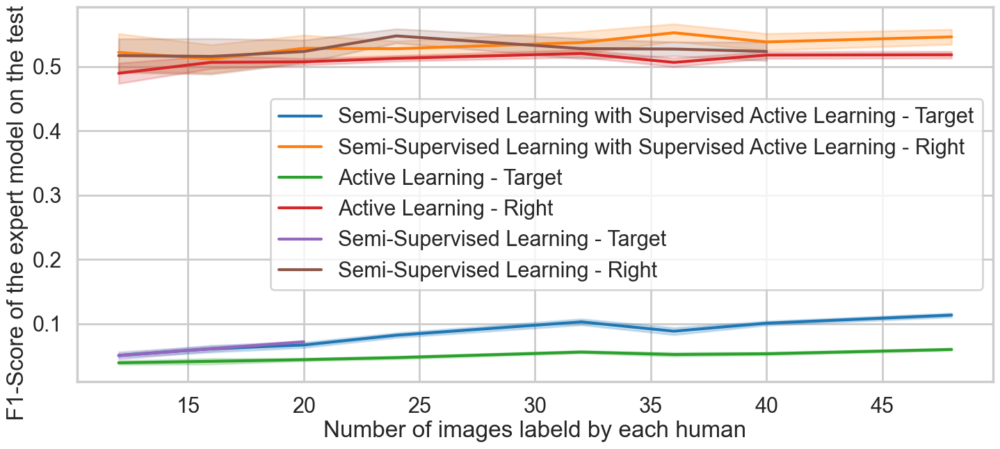

In [17]:
plt.figure()
sns.set_context("poster")
sns.set_style("whitegrid")
#f, ax = plt.subplots(figsize=(30, 20))
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")
#, "labeler_id"
#ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "al_labels"]].apply(tuple, axis=1), 
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)

#ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

#ax.set(ylim=(65, 95))


ax.set(xlabel='Number of images labeld by each human', ylabel="F1-Score of the expert model on the test set")
plt.legend()
leg_texts = ["Semi-Supervised Learning with Supervised Active Learning - Target", "Semi-Supervised Learning with Supervised Active Learning - Right", "Active Learning - Target", "Active Learning - Right", "Semi-Supervised Learning - Target", "Semi-Supervised Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/CIFAR/expert_overall.png")

In [18]:
a = dff.groupby(["expert_predict", "setting", "labeler_id", "labeled"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]

#pivoted_df = a.pivot_table(index=["setting", "expert_predict", "labeler_id"], columns="labeled", values="value")
pivoted_df = a.pivot_table(index=["expert_predict", "setting", ], columns="labeled", values=["mean", "std"])

# Reset index again if needed
pivoted_df = pivoted_df.reset_index()
pivoted_df.to_csv("../../tables/CIFAR/expert_f1.csv")
pivoted_df
#a.to_excel("../experts.xlsx")#.reset_index()
#a.reset_index().pivot_table(columns=["setting", "expert_predict", "labeled"])#set_index("labeled").T#.melt(id_vars=["setting", "expert_predict"], value_name="value")

expert_predict setting      mean                                \
labeled                               12        16        20        24   
0                right      AL  0.489285  0.506356  0.507126  0.512479   
1                right     SSL  0.516757  0.515577  0.523143  0.547441   
2                right  SSL_AL  0.521774  0.511603  0.528129  0.527494   
3               target      AL  0.039063  0.041269  0.043926  0.047029   
4               target     SSL  0.050215       NaN  0.071634       NaN   
5               target  SSL_AL  0.050499  0.060735  0.066654  0.081865   

                                                      std                      \
labeled        32        36        40        48        12        16        20   
0        0.520146  0.506265  0.517631  0.518088  0.042970  0.025161  0.021223   
1        0.527649  0.527020  0.523327       NaN  0.027931  0.020007  0.051343   
2        0.537108  0.552303  0.538050  0.545929  0.071522  0.032666  0.076564   
3        0.055721  0.051945  0.053066  0.059732  0.007946  0.013172  0.006395   
4             NaN       NaN       NaN       NaN  0.017314       NaN       NaN   
5        0.102575  0.088157  0.100548  0.113169  0.016353  0.015028  0.015247   

                                                           
labeled        24        32        36        40        48  
0        0.020765  0.019177  0.024156  0.024679  0.027366  
1        0.033831  0.052705  0.041584  0.055794       NaN  
2        0.045472  0.042397  0.054168  0.060848  0.058800  
3        0.010608  0.007603  0.011225  0.010450  0.009420  
4             NaN       NaN       NaN       NaN       NaN  
5        0.018385  0.018547  0.018308  0.016088  0.017280

In [23]:
pivoted_df.loc[[1, 2],["mean", "std"]].pct_change().loc[:,"std"].iloc[:,:].mean(axis=1)*100

1          NaN
2    46.091085
dtype: float64

In [52]:
y = pivoted_df.loc[[5], ["mean"]]["mean"].iloc[:,1:].to_numpy()

In [53]:
x = pivoted_df.loc[[5], ["mean"]]["mean"].iloc[:,1:].columns
x.to_list()

[16, 20, 24, 32, 36, 40, 48]

In [54]:
stats.linregress(x.to_list(), y)

LinregressResult(slope=0.0015711453234031581, intercept=0.03919071210706499, rvalue=0.9337130204689129, pvalue=0.0020961639831200748, stderr=0.0002694189043904567, intercept_stderr=0.008792897192753002)

<Figure size 640x480 with 0 Axes>

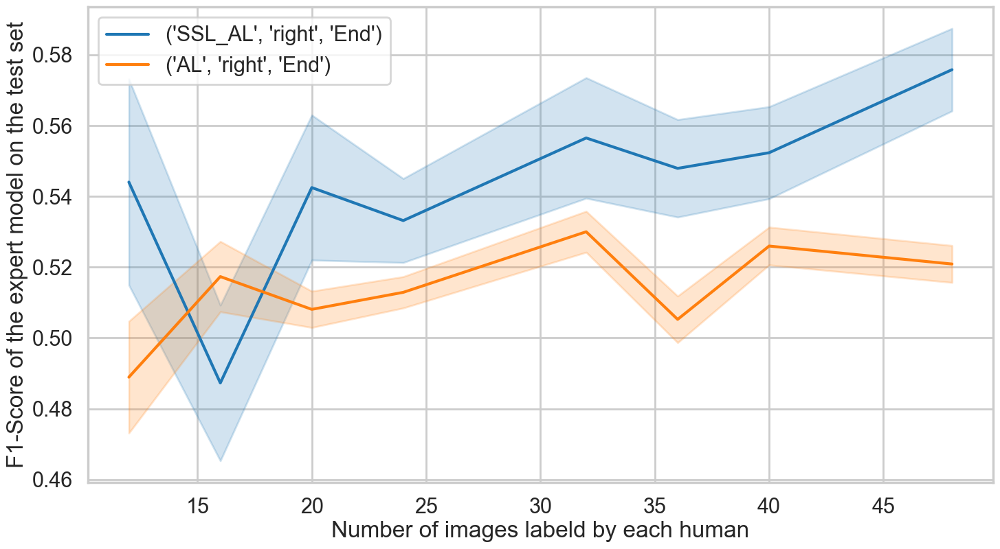

In [90]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == False]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

plt.figure()
sns.set_context("poster")
#f, ax = plt.subplots(figsize=(30, 20))
f, ax = plt.subplots(figsize=(17, 9))
sns.set_context("poster")
#, "labeler_id"
#ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "al_labels"]].apply(tuple, axis=1), 
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "variable"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)

#ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

#ax.set(ylim=(65, 95))


ax.set(xlabel='Number of images labeld by each human', ylabel="F1-Score of the expert model on the test set")
plt.legend()
#leg_texts = ["Semi-Supervised Learning with Supervised Active Learning - Target", "Semi-Supervised Learning with Supervised Active Learning - Right", "Active Learning - Target", "Active Learning - Right", ]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/CIFAR/expert_overall.png")

In [83]:
dff = df.copy()
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["overlap"] == 0]
dff = dff[dff["sample_equal"] == False]

<Figure size 640x480 with 0 Axes>

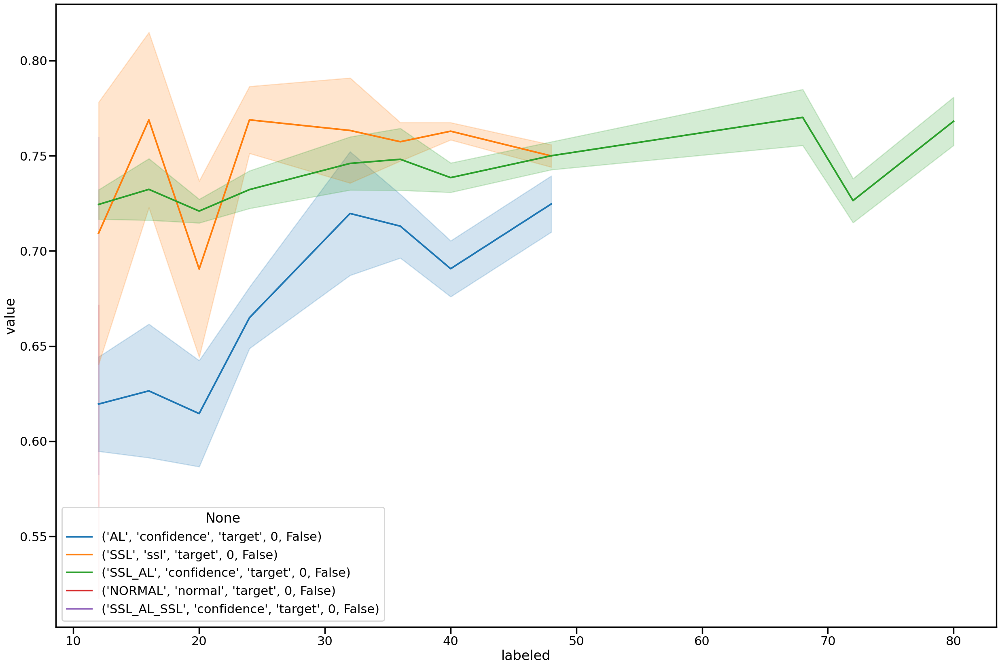

In [84]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=(30, 20))
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)

In [ ]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
#dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]
#dff = dff[dff["labeler_ids"] != "[4323195249, 4295232296]"]
#dff = dff[dff["labeler_ids"] != "[4295349121, 4295342357]"]
dff = dff[dff["mod"] != "disagreement_diff"]
#dff = df[df["expert_predict"] == "right"].reset_index()
dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeld by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning", "Supervised"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped(4295349121, "Test", "accurancy", var_columns=var_columns, unwanted_tuples=cut_out)

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax)

df_runs.head(30)

In [23]:
df_runs

,labeled
4,12
24,20
40,36
45,16
50,24
60,40
74,68
153,72
161,32
169,48


,labeled
4,12
45,16
24,20
50,24
161,32
40,36
60,40
169,48
74,68
153,72


<Figure size 640x480 with 0 Axes>

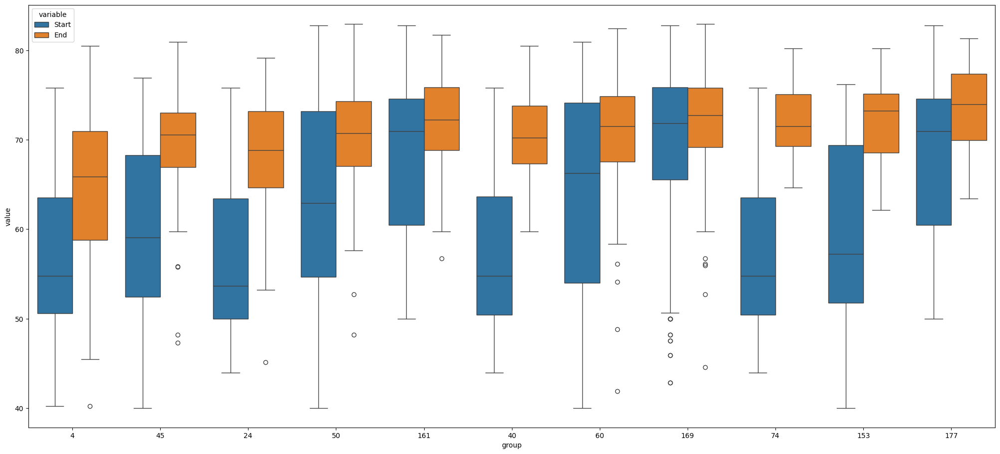

In [21]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
fix_columns = [("setting", "SSL_AL"), ("expert_predict", "target"), ("mod", "confidence")]#, ("labeler_ids", "[4323195249, 4295232296]")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped_hue(4323195249, "Test", "accurancy", var_columns=var_columns, fix_columns=fix_columns)

sort_index = df_runs.sort_values(by=["labeled"]).index

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax, order=sort_index)

df_runs.sort_values(by=["labeled"]).head(100)

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
fix_columns = [("setting", "SSL_AL"), ("expert_predict", "target"), ("mod", "confidence")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped_hue(4295232296, "Test", "accurancy", var_columns=var_columns, fix_columns=fix_columns)

sort_index = df_runs.sort_values(by=["labeled"]).index

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax, order=sort_index)

df_runs.sort_values(by=["labeled"]).head(100)

In [ ]:
def create_expert_metrics(met):
    metrics = {}
    for expert_id in met[0]:
        metrics[expert_id] = []
        for run in met:
            start_metrics = {}
            end_metrics = {}
            for seed_fold, value in run[expert_id].items():
                if "Start" in value:
                    start_metrics[seed_fold] = value["Start"]
                end_metrics[seed_fold] = value["End"]
            if len(start_metrics) == 0:
                start_metrics = end_metrics
            metrics[expert_id].append({
                "Start": start_metrics,
                "End": end_metrics
            })
    return metrics

In [ ]:
create_expert_metrics(expertMetrics.get_expert_values("Test", "f1"))

In [ ]:
get_expert_df(create_expert_metrics(expertMetrics.get_expert_values("Test", "f1")), 4323195249)

In [ ]:
import matplotlib.pyplot as plt

def get_expert_values(step, metric_name):

    mett = []
    for element in metrics2:
        met = {}
        for seed, value1 in element["expert metrics"].items():
            for fold, value2 in value1.items():
                for expert, value3 in value2.items():
                    if expert not in met:
                        met[expert] = {}
                    met[expert][f"Seed_{seed}_Fold_{fold}"] = {}
                    met[expert][f"Seed_{seed}_Fold_{fold}"]["End"] = value3[step]["End"][metric_name]
                    if "Start" in value3[step]:
                        met[expert][f"Seed_{seed}_Fold_{fold}"]["Start"] = value3[step]["Start"][metric_name]
                    else:
                        pass
        mett.append(met)
    return mett

def get_single_values(met, run, expert_id, step):
    values = []
    for key, value in met[run][expert_id].items():
        values.append(value[step])
    return values

def plot_expert_values(met):
    df1 = pd.DataFrame(met[4323195249])
    df2 = pd.DataFrame(met[4295232296])

    fd1 = df1.T.reset_index()
    fd1["expert"] = 4323195249
    fd2 = df2.T.reset_index()
    fd2["expert"] = 4295232296
    df3 = pd.concat([fd1, fd2])
    df3 = df3.melt(id_vars=["index", "expert"])

    plt.figure()
    sns.boxplot(df3, x="expert", y="value",
            hue="variable",)

In [ ]:
met = get_expert_values("Val", "accurancy_balanced")

plot_expert_values(met[2])
plot_expert_values(met[1])
df_runs

In [ ]:
met = get_expert_values("Val", "accurancy_balanced")

In [ ]:
def create_expert_metrics(met):
    metrics = {}
    for expert_id in met[0]:
        metrics[expert_id] = []
        for run in met:
            start_metrics = {}
            end_metrics = {}
            for seed_fold, value in run[expert_id].items():
                if "Start" in value:
                    start_metrics[seed_fold] = value["Start"]
                end_metrics[seed_fold] = value["End"]
            if len(start_metrics) == 0:
                start_metrics = end_metrics
            metrics[expert_id].append({
                "Start": start_metrics,
                "End": end_metrics
            })
    return metrics

def get_expert_df(metrics, expert_id, start=False):
    if start:
        df1 = pd.DataFrame([row["Start"] for row in metrics[expert_id]]).reset_index().melt(id_vars=['index'], var_name='seed_fold', value_name='start')
    df2 = pd.DataFrame([row["End"] for row in metrics[expert_id]]).reset_index().melt(id_vars=['index'], var_name='seed_fold', value_name='end')

    if start:
        df_final = df1
        df_final["end"] = df2["end"]
    else:
        df_final = df2
    df_final = df_final.melt(id_vars=["index", "seed_fold"], var_name="step")

    return df_final

def plot_expert_runs_al(metrics, expert_id, step, metrics_name):
    met = get_expert_values(step, metrics_name)
    df = get_expert_df(create_expert_metrics(met), expert_id, start=True)
    plt.figure()
    f, ax = plt.subplots(figsize=(25, 11))
    sns.boxplot(df, x="index", y="value", hue="step", ax=ax)

def plot_expert_runs_end(metrics, expert_id, step, metrics_name):
    met = get_expert_values(step, metrics_name)
    df = get_expert_df(create_expert_metrics(met), expert_id)
    plt.figure()
    f, ax = plt.subplots(figsize=(25, 11))
    sns.boxplot(df, x="index", y="value", ax=ax)

In [ ]:
plot_expert_runs_al(metrics, 4323195249, "Test", "accurancy_balanced")

In [ ]:
plot_expert_runs_end(metrics, 4323195249, "Val", "accurancy_balanced")

In [ ]:
from zipfile import ZipFile as zipfile

with zipfile("../../Metrics_Folder/NIH/Metrics_1013.zip", 'r') as zip: 
    # printing all the contents of the zip file 
    zip.printdir() 
  
    # extracting all the files 
    print('Extracting all the files now...') 
    zip.extractall("../../Metrics_Folder/NIH/") 
    print('Done!') 

In [ ]:
with open("../../Metrics_Folder/NIH/Metrics_688.pickle", 'rb') as handle:
    metrics = pickle.load(handle)

In [ ]:
runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

In [ ]:
remove_index = []
for i in range(len(metrics)):
    if metrics[i]["mod"] == "disagreement_diff":
        remove_index.append(i)

In [ ]:
for i in remove_index[::-1]:
    del metrics[i]

In [ ]:
with open("../Metrics_Folder/Metrics_700.pickle", 'wb') as handle:
    pickle.dump(metrics, handle, protocol=pickle.HIGHEST_PROTOCOL)